# FINAL PROJECT - ALLSVENSKAN PLAYER PERFORMANCES

In [205]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import math
from math import pi
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from yellowbrick.cluster import KElbowVisualizer
from adjustText import adjust_text


import matplotlib.pyplot as plt
from mplsoccer import PyPizza, FontManager


## Creating new dataframes

In [206]:
path_games = '/Users/axelreman/Documents/Nod Coding Bootcamp/Projects/Project_6_Finalproject/Allsvenskan_2021'
path_player_data = '/Users/axelreman/Documents/Nod Coding Bootcamp/Projects/Project_6_Finalproject/Allsvenskan_2021/Players'
path = '/Users/axelreman/Documents/Nod Coding Bootcamp/Projects/Project_6_Finalproject/'

df = pd.read_json(f'{path_games}/allsvenskan_data.json')
player_df = pd.read_json(f'{path_player_data}/Allsvenskan, 2021-players.json')
player_actions_df = pd.read_csv(f'{path}player_actions_data.csv')
player_positions_df = pd.read_csv(f'{path}player_position_data.csv')
events_df = pd.read_csv(f'{path}all_events_data.csv')


### Functions

In [2]:
def add_values_to_dataframe(main_df, main_index, values_df, values_index):
    """
    This function adds specific values from a source DataFrame (values_df) to a target DataFrame (main_df) 
    based on specified indices for each DataFrame.

    Parameters:
    main_df (pd.DataFrame): The target DataFrame where values will be added.
    main_index (int): The index in the target DataFrame where values will be added.
    values_df (pd.DataFrame): The source DataFrame from which values will be taken.
    values_index (int): The index in the source DataFrame from which values will be taken.

    Returns:
    None. This function operates in-place, modifying the target DataFrame directly.
"""

    main_df.at[main_index, 'player'] = values_df.at[values_index, 'player']
    main_df.at[main_index, 'position'] = values_df.at[values_index, 'position']
    main_df.at[main_index, 'squad'] = values_df.at[values_index, 'squad']
    main_df.at[main_index, 'age'] = values_df.at[values_index, 'age']
    main_df.at[main_index, 'born'] = values_df.at[values_index, 'born']
    main_df.at[main_index, 'matches_played'] = values_df.at[values_index, 'matches_played']
    main_df.at[main_index, 'starts'] = values_df.at[values_index, 'starts']
    main_df.at[main_index, 'minutes_y'] = values_df.at[values_index, 'minutes']

def create_pyPizza_spiderplot(dataframe, playername):
    """
    Create a combined PyPizza chart and spiderplot.

    Parameters:
        dataframe (pd.DataFrame): DataFrame containing the parameter values.
                                  The columns are the parameters and the values are the row values.
        playername (str): Name of the player for the plot title.

    Returns:
        None (displays the plot).

    """

    # Multiply all values by 100 and round to 0 decimals
    dataframe = dataframe.copy()
    dataframe.iloc[:, 1:] = dataframe.iloc[:, 1:].mul(100).round(0)

    # Extract params from the columns of the dataframe
    params = list(dataframe.columns)[1:]

    # Extract values from the row of the dataframe
    values = list(dataframe.iloc[0, 1:])

    font_normal = FontManager('https://raw.githubusercontent.com/google/fonts/main/apache/roboto/'
                              'Roboto%5Bwdth,wght%5D.ttf')
    font_italic = FontManager('https://raw.githubusercontent.com/google/fonts/main/apache/roboto/'
                              'Roboto-Italic%5Bwdth,wght%5D.ttf')
    font_bold = FontManager('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
                            'RobotoSlab%5Bwght%5D.ttf')

    # Instantiate PyPizza class
    baker = PyPizza(
        params=params,
        straight_line_color="#000000",
        straight_line_lw=1,
        last_circle_lw=1,
        other_circle_lw=1,
        other_circle_ls="-."
    )

    # Plot pizza
    fig, ax = baker.make_pizza(
        values,
        figsize=(8, 8),
        param_location=110,
        kwargs_slices=dict(
            facecolor="cornflowerblue", edgecolor="#000000",
            zorder=2, linewidth=1
        ),
        kwargs_params=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, va="center"
        ),
        kwargs_values=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="cornflowerblue",
                boxstyle="round,pad=0.2", lw=1
            )
        )
    )

    # Add title
    fig.text(
        0.515, 0.97, f'{playername} compared to rest of league', size=18,
        ha="center", fontproperties=font_bold.prop, color="#000000"
    )

    # Add credits
    CREDIT_1 = "data: Football Analytics"
    CREDIT_2 = "by: Axel Reman"

    fig.text(
        0.99, 0.005, f"{CREDIT_1}\n{CREDIT_2}", size=9,
        fontproperties=font_italic.prop, color="#000000",
        ha="right"
    )
    # Save the plot as an image file
    plt.savefig(f'{playername}_spiderplot.png', transparent=True, dpi=600)
    
    plt.show()


def spiderplotdata_defenders(dataframe, index):
    """
    This function creates a DataFrame for a row (each row is a specific player) and league averages based on various defensive metrics.
    
    These statistics are scaled for the player and compared to the average for the league.
    
    Parameters:
    dataframe (pd.DataFrame): The input DataFrame which contains statistics for all players.
    index (int): The index of the specific player in the DataFrame for which the statistics will be extracted.
    
    Returns:
    spiderplot_df (pd.DataFrame): A DataFrame containing the player's name, league average, and various defensive metrics.
    """
    data = {
        'Player': [f"{dataframe.iloc[index]['friendly_name']}", 'League Avg'],
        'Interception\n success rate': [dataframe.iloc[index].interception_success_scaled, dataframe.loc[dataframe['DF'] == 1].interception_success_scaled.mean()],
        'Interception\n count': [dataframe.iloc[index].interceptions_scaled, dataframe.loc[dataframe['DF'] == 1].interceptions_scaled.mean()],
        'Clearance\n accuracy': [dataframe.iloc[index].clearance_accuracy_scaled, dataframe.loc[dataframe['DF'] == 1].clearance_accuracy_scaled.mean()],
        'Clearance\n count': [dataframe.iloc[index].clearances_scaled, dataframe.loc[dataframe['DF'] == 1].clearances_scaled.mean()],
        'Block count': [dataframe.iloc[index].blocks_scaled, dataframe.loc[dataframe['DF'] == 1].blocks_scaled.mean()],
        'Block\n success rate': [dataframe.iloc[index].block_success_scaled, dataframe.loc[dataframe['DF'] == 1].block_success_scaled.mean()],
        'Challenge\n success rate': [dataframe.iloc[index].challenge_success, dataframe.loc[dataframe['DF'] == 1].challenge_success.mean()],
        'Challenge\n count': [dataframe.iloc[index].challenges_scaled, dataframe.loc[dataframe['DF'] == 1].challenges_scaled.mean()],
        'Passing\n percentage': [dataframe.iloc[index].passing_percentage, dataframe.loc[dataframe['DF'] == 1].passing_percentage.mean()],
        'Dribbling': [dataframe.iloc[index].dribble_success_rate_scaled, dataframe.loc[dataframe['DF'] == 1].dribble_success_rate_scaled.mean()]
    }
    
    # Create a pandas DataFrame from the data dictionary
    spiderplot_df = pd.DataFrame(data)
    
    # Print the DataFrame
    return spiderplot_df

def spiderplotdata_midfielders(dataframe, index):
    """This function creates a DataFrame for a row (each row represents a specific midfielder) and league averages based on various midfield metrics.

    These statistics are scaled for the player and compared to the average for the league.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame which contains statistics for all players.
    index (int): The index of the specific player in the DataFrame for which the statistics will be extracted.

    Returns:
    spiderplot_df (pd.DataFrame): A DataFrame containing the player's name, league average, and various midfield metrics.
    """

    data = {
        'Player': [f"{dataframe.iloc[index]['friendly_name']}", 'League Avg'],
        'Passing\npercentage': [dataframe.iloc[index].passing_percentage, dataframe.loc[dataframe['MF'] == 1].passing_percentage.mean()],
        'Key passes': [dataframe.iloc[index]['Key pass_scaled'], dataframe.loc[dataframe['MF'] == 1]['Key pass_scaled'].mean()],
        'Dribble\nsuccess rate': [dataframe.iloc[index]['dribble_success_rate_scaled'], dataframe.loc[dataframe['MF'] == 1]['dribble_success_rate_scaled'].mean()],
        'Challenge\nsuccess rate': [dataframe.iloc[index]['challenge_success_scaled'], dataframe.loc[dataframe['MF'] == 1]['challenge_success_scaled'].mean()],
        'Amount of\nchallenges': [dataframe.iloc[index]['challenges_scaled'], dataframe.loc[dataframe['MF'] == 1]['challenges_scaled'].mean()],
        'Amount of\nshots': [dataframe.iloc[index]['Shot_scaled'], dataframe.loc[dataframe['MF'] == 1]['Shot_scaled'].mean()],
        'Conversion\nrate': [dataframe.iloc[index]['conversion_rate_scaled'], dataframe.loc[dataframe['MF'] == 1]['conversion_rate_scaled'].mean()],
        'Interception\nsuccess rate': [dataframe.iloc[index]['interception_success_scaled'], dataframe.loc[dataframe['MF'] == 1]['interception_success_scaled'].mean()],
        'Amount of\ninterceptions': [dataframe.iloc[index]['interceptions_scaled'], dataframe.loc[dataframe['MF'] == 1]['interceptions_scaled'].mean()],
        'Discipline\nindex': [dataframe.iloc[index]['discipline_index_scaled'], dataframe.loc[dataframe['MF'] == 1]['discipline_index_scaled'].mean()]
    }
    
    # Create a pandas DataFrame from the data dictionary
    spiderplot_df = pd.DataFrame(data)
    
    # Print the DataFrame
    return spiderplot_df

def spiderplotdata_attackers(dataframe, index):
    """
    This function creates a DataFrame for a row (each row represents a specific forward player) and league averages based on various forward metrics.

    These statistics are scaled for the player and compared to the average for the league.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame which contains statistics for all players.
    index (int): The index of the specific player in the DataFrame for which the statistics will be extracted.

    Returns:
    spiderplot_df (pd.DataFrame): A DataFrame containing the player's name, league average, and various forward metrics.
"""

    data = {
        'Player': [f"{dataframe.iloc[index]['friendly_name']}", 'League Avg'],
        'Amount of\ncarries': [dataframe.iloc[index]['Carry_scaled'], dataframe.loc[dataframe['FW'] == 1]['Carry_scaled'].mean()],
        'Carries into\nthe box': [dataframe.iloc[index]['Carry into the box_scaled'], dataframe.loc[dataframe['FW'] == 1]['Carry into the box_scaled'].mean()],
        'Dribble\nsuccess rate': [dataframe.iloc[index]['dribble_success_rate_scaled'], dataframe.loc[dataframe['FW'] == 1]['dribble_success_rate_scaled'].mean()],
        'Amount of\nkey passes': [dataframe.iloc[index]['Key pass_scaled'], dataframe.loc[dataframe['FW'] == 1]['Key pass_scaled'].mean()],
        'Passing\naccuracy': [dataframe.iloc[index]['passing_percentage_scaled'], dataframe.loc[dataframe['FW'] == 1]['passing_percentage_scaled'].mean()],
        'Passes into\nthe box': [dataframe.iloc[index]['Pass into the box_scaled'], dataframe.loc[dataframe['FW'] == 1]['Pass into the box_scaled'].mean()],
        'Amount of\nshots': [dataframe.iloc[index]['Shot_scaled'], dataframe.loc[dataframe['FW'] == 1]['Shot_scaled'].mean()],
        'Conversion\nrate': [dataframe.iloc[index]['conversion_rate_scaled'], dataframe.loc[dataframe['FW'] == 1]['conversion_rate_scaled'].mean()],
        'Crossing\nsuccess rate': [dataframe.iloc[index]['crossing_accuracy_scaled'], dataframe.loc[dataframe['FW'] == 1]['crossing_accuracy_scaled'].mean()],
        'Amount of\ncrosses': [dataframe.iloc[index]['crosses_scaled'], dataframe.loc[dataframe['FW'] == 1]['crosses_scaled'].mean()],
        'Discipline\nindex': [dataframe.iloc[index]['Offside_scaled'], dataframe.loc[dataframe['FW'] == 1]['Offside_scaled'].mean()]
    }
    

    # Create a pandas DataFrame from the data dictionary
    spiderplot_df = pd.DataFrame(data)
    
    # Print the DataFrame
    return spiderplot_df

def scale_columns(dataframe, columns):
    """
    Scale specified columns in a DataFrame using Min-Max scaling.

    Parameters:
        dataframe (pd.DataFrame): DataFrame containing the columns to be scaled.
        columns (list): List of column names to be scaled.

    Returns:
        pd.DataFrame: DataFrame with scaled columns added.

    Example:
        # Define initial columns to be scaled
        initial_columns = ['Air challenge successful', 'Air challenge unsuccessful', 'Assist', 'Bad ball control', ...]

        # Scale the columns in the DataFrame
        scaled_dataframe = scale_columns(experiment_threshold, initial_columns)
    """
    # Create a scaler object
    scaler = MinMaxScaler()

    # Scale the columns
    scaled_columns = pd.DataFrame(scaler.fit_transform(dataframe[columns]), columns=[f"{col}_scaled" for col in columns])

    # Concatenate the scaled columns with the remaining columns in the dataframe
    scaled_dataframe = pd.concat([dataframe, scaled_columns], axis=1)

    return scaled_dataframe

def print_missing_values(dataframe):
    """
    This function prints the column names and respective row indices of a DataFrame where there are missing values (NaN).

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame which is checked for missing values.

    Returns:
    None. Prints the column names and row indices with missing values directly to the console.
    """

    for column, series in dataframe.iteritems():
        if series.isna().any():
            print(f"Missing values in column: {column}")
            missing_rows = series[series.isna()]
            for index, value in missing_rows.iteritems():
                print(f"Row {index}: {value}")


## Data cleaning

In [422]:
events_df

,xdest,xpos,header,next_player,game_time,ypos,xg,ydest,player,penalty,end_time,team,action,xp,throw_in,external_id,start_time,xt
0,28.0,51,False,L. Väisänen,0,50,NaN,51.0,J. Okkels,False,8,Elfsborg,Pass accurate,0.916179,False,1,4,-0.005630
1,71.0,28,False,A. Ejupi,0,51,NaN,32.0,L. Väisänen,False,10,Elfsborg,Pass accurate,0.521989,False,2,8,0.014677
2,NaN,29,False,M. Ndione,0,68,NaN,NaN,A. Ejupi,False,10,Varberg,Challenge successful,NaN,False,3,10,NaN
3,NaN,29,False,M. Ndione,0,68,NaN,NaN,A. Ejupi,False,10,Varberg,Air challenge successful,NaN,False,4,10,NaN
4,NaN,71,False,P. Frick,0,32,NaN,NaN,M. Ndione,False,10,Elfsborg,Challenge unsuccessful,NaN,False,5,10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623414,92.0,85,False,M. Ndione,98,18,NaN,42.0,A. Bernhardsson,False,5914,Elfsborg,Pass accurate,0.559090,False,2430,5913,0.142091
623415,92.0,85,False,M. Ndione,98,18,NaN,42.0,A. Bernhardsson,False,5914,Elfsborg,Pass into the box,NaN,False,2431,5913,NaN
623416,NaN,0,False,A. Skovgaard,98,43,NaN,NaN,B. Allain,False,5929,Örebro,Goal kicks (Successful actions),NaN,False,2432,5925,NaN
623417,28.0,26,False,B. Hjertstrand,98,76,NaN,36.0,A. Skovgaard,False,5932,Örebro,Pass accurate,0.813371,False,2433,5929,0.001086


In [208]:
# Loop over columns
for column in player_positions_df.columns:
    # Loop over rows
    for index, value in player_positions_df[column].items():
        if pd.isnull(value):
            print(f"Null value found at column '{column}', row '{index}'")


## CHECKING FOR NULL VALUES

Null value found at column 'Player', row '117'
Null value found at column 'Nation', row '117'


In [209]:
player_positions_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428 entries, 0 to 427
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rk      428 non-null    object 
 1   Player  427 non-null    object 
 2   Nation  427 non-null    object 
 3   Pos     428 non-null    object 
 4   Squad   428 non-null    int64  
 5   Age     428 non-null    int64  
 6   Born    428 non-null    int64  
 7   MP      428 non-null    int64  
 8   Starts  428 non-null    object 
 9   Min     428 non-null    float64
 10  90s     428 non-null    int64  
dtypes: float64(1), int64(5), object(5)
memory usage: 36.9+ KB


In [210]:
ppdf_mapper = {
    'Rk': 'player',
    'Player': 'nation',
    'Nation': 'position',
    'Pos': 'squad',
    'Squad': 'age',
    'Age': 'born',
    'Born': 'matches_played',
    'MP': 'starts',
    'Starts': 'minutes',
    'Min': '90s',
    '90s': 'Goals'
}


player_positions_df.rename(columns=ppdf_mapper, inplace=True)
player_positions_df.drop(columns=['Goals', 'nation'], inplace=True)


# Correcting column names in the scraped dataframe

In [211]:
player_positions_df['minutes'] = player_positions_df['minutes'].str.replace(',', '')
player_positions_df['minutes'] = player_positions_df['minutes'].astype(int)
player_positions_df['90s'] = player_positions_df['90s'].astype(float)
player_positions_df['matches_played'] = player_positions_df['matches_played'].astype(int)
player_positions_df['starts'] = player_positions_df['starts'].astype(int)
player_positions_df['born'] = player_positions_df['born'].astype(int)
player_positions_df['age'] = player_positions_df['age'].astype(int)

# Converting column types

In [212]:
team_mapper = {
'Malmö':'Malmö FF',
'Norrköping':'IFK Norrköping',   
'Göteborg':'IFK Göteborg',      
'Östersund':'Östersunds FK',
'AIK Stockholm': 'AIK',
'Varberg':'Varberg',
'Häcken':'Häcken',
'Örebro':'Örebro',
'Hammarby':'Hammarby',
'Sirius':'Sirius',
'Mjällby':'Mjällby',
'Kalmar':'Kalmar',
'Elfsborg':'Elfsborg',
'Degerfors':'Degerfors',
'Djurgården':'Djurgården',
'Halmstad':'Halmstad'}

player_positions_df['squad'] = player_positions_df['squad'].map(team_mapper)

# Correcting team names to match between dataframes

In [213]:
merged_df = pd.merge(player_df, player_positions_df, left_on=['team', 'name'], right_on=['squad', 'player'], how='left')

# Merging two dataframes from different sources

In [214]:
add_values_to_dataframe(merged_df, 71, player_positions_df, 230)
add_values_to_dataframe(merged_df, 40, player_positions_df, 231)
add_values_to_dataframe(merged_df, 0, player_positions_df, 232)
add_values_to_dataframe(merged_df, 4, player_positions_df, 307)
add_values_to_dataframe(merged_df, 5, player_positions_df, 371)
add_values_to_dataframe(merged_df, 78, player_positions_df, 321)
add_values_to_dataframe(merged_df, 327, player_positions_df, 39)
add_values_to_dataframe(merged_df, 328, player_positions_df, 116)
add_values_to_dataframe(merged_df, 384, player_positions_df, 357)
add_values_to_dataframe(merged_df, 421, player_positions_df, 14)
add_values_to_dataframe(merged_df, 210, player_positions_df, 416)
add_values_to_dataframe(merged_df, 287, player_positions_df, 46)
add_values_to_dataframe(merged_df, 316, player_positions_df, 45)
add_values_to_dataframe(merged_df, 360, player_positions_df, 99)
add_values_to_dataframe(merged_df, 23, player_positions_df, 427)
add_values_to_dataframe(merged_df, 161, player_positions_df, 135)
add_values_to_dataframe(merged_df, 177, player_positions_df, 104)
add_values_to_dataframe(merged_df, 178, player_positions_df, 323)
add_values_to_dataframe(merged_df, 265, player_positions_df, 2)
add_values_to_dataframe(merged_df, 333, player_positions_df, 257)
add_values_to_dataframe(merged_df, 110, player_positions_df, 181)
add_values_to_dataframe(merged_df, 127, player_positions_df, 297)
add_values_to_dataframe(merged_df, 358, player_positions_df, 148)
add_values_to_dataframe(merged_df, 182, player_positions_df, 201)
add_values_to_dataframe(merged_df, 185, player_positions_df, 286)
add_values_to_dataframe(merged_df, 190, player_positions_df, 26)
add_values_to_dataframe(merged_df, 193, player_positions_df, 392)
add_values_to_dataframe(merged_df, 420, player_positions_df, 106)
add_values_to_dataframe(merged_df, 234, player_positions_df, 350)
add_values_to_dataframe(merged_df, 268, player_positions_df, 305)
add_values_to_dataframe(merged_df, 282, player_positions_df, 312)
add_values_to_dataframe(merged_df, 335, player_positions_df, 197)
add_values_to_dataframe(merged_df, 366, player_positions_df, 207)
add_values_to_dataframe(merged_df, 425, player_positions_df, 168)
add_values_to_dataframe(merged_df, 84, player_positions_df, 157)
add_values_to_dataframe(merged_df, 92, player_positions_df, 114)
add_values_to_dataframe(merged_df, 95, player_positions_df, 204)
add_values_to_dataframe(merged_df, 194, player_positions_df, 6)
add_values_to_dataframe(merged_df, 307, player_positions_df, 385)
add_values_to_dataframe(merged_df, 343, player_positions_df, 10)
add_values_to_dataframe(merged_df, 33, player_positions_df, 344)
add_values_to_dataframe(merged_df, 47, player_positions_df, 356)
add_values_to_dataframe(merged_df, 106, player_positions_df, 185)
add_values_to_dataframe(merged_df, 134, player_positions_df, 419)
add_values_to_dataframe(merged_df, 361, player_positions_df, 49)
add_values_to_dataframe(merged_df, 202, player_positions_df, 248)
add_values_to_dataframe(merged_df, 212, player_positions_df, 187)
add_values_to_dataframe(merged_df, 217, player_positions_df, 152)
add_values_to_dataframe(merged_df, 254, player_positions_df, 24)
add_values_to_dataframe(merged_df, 321, player_positions_df, 237)
add_values_to_dataframe(merged_df, 382, player_positions_df, 386)
add_values_to_dataframe(merged_df, 390, player_positions_df, 342)
add_values_to_dataframe(merged_df, 406, player_positions_df, 67)
add_values_to_dataframe(merged_df, 1, player_positions_df, 151)
add_values_to_dataframe(merged_df, 10, player_positions_df, 334)
add_values_to_dataframe(merged_df, 64, player_positions_df, 57)
add_values_to_dataframe(merged_df, 428, player_positions_df, 241)
add_values_to_dataframe(merged_df, 123, player_positions_df, 280)
add_values_to_dataframe(merged_df, 132, player_positions_df, 94)
add_values_to_dataframe(merged_df, 146, player_positions_df, 327)
add_values_to_dataframe(merged_df, 147, player_positions_df, 314)
add_values_to_dataframe(merged_df, 154, player_positions_df, 4)
add_values_to_dataframe(merged_df, 156, player_positions_df, 93)
add_values_to_dataframe(merged_df, 284, player_positions_df, 105)
add_values_to_dataframe(merged_df, 378, player_positions_df, 72)
add_values_to_dataframe(merged_df, 88, player_positions_df, 146)
add_values_to_dataframe(merged_df, 90, player_positions_df, 163)
add_values_to_dataframe(merged_df, 96, player_positions_df, 278)
add_values_to_dataframe(merged_df, 101, player_positions_df, 119)
add_values_to_dataframe(merged_df, 373, player_positions_df, 125)
add_values_to_dataframe(merged_df, 376, player_positions_df, 317)
add_values_to_dataframe(merged_df, 246, player_positions_df, 270)
add_values_to_dataframe(merged_df, 259, player_positions_df, 260)
add_values_to_dataframe(merged_df, 311, player_positions_df, 283)
add_values_to_dataframe(merged_df, 245, player_positions_df, 270)
add_values_to_dataframe(merged_df, 52, player_positions_df, 183)
add_values_to_dataframe(merged_df, 59, player_positions_df, 9)
add_values_to_dataframe(merged_df, 181, player_positions_df, 359)
add_values_to_dataframe(merged_df, 380, player_positions_df, 212)
add_values_to_dataframe(merged_df, 410, player_positions_df, 41)
add_values_to_dataframe(merged_df, 417, player_positions_df, 217)
add_values_to_dataframe(merged_df, 70, player_positions_df, 417)
add_values_to_dataframe(merged_df, 148, player_positions_df, 420)
add_values_to_dataframe(merged_df, 228, player_positions_df, 132)
add_values_to_dataframe(merged_df, 272, player_positions_df, 169)
add_values_to_dataframe(merged_df, 297, player_positions_df, 311)
add_values_to_dataframe(merged_df, 140, player_positions_df, 266)
add_values_to_dataframe(merged_df, 160, player_positions_df, 279)
add_values_to_dataframe(merged_df, 162, player_positions_df, 272)
add_values_to_dataframe(merged_df, 166, player_positions_df, 140)

merged_df.drop(index=350, inplace=True)   # Samuel Wikman in Sirius, missing in main dataset
merged_df.drop(index=423, inplace=True)  # B. Engdahl in Hammarby, missing position

# ADDING DATA TO ROWS THAT COULDNT BE MERGED

In [215]:
merged_df.drop(columns='90s', inplace=True)
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 427 entries, 0 to 428
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   minutes_x       427 non-null    object 
 1   friendly_name   427 non-null    object 
 2   name            427 non-null    object 
 3   team            427 non-null    object 
 4   player          427 non-null    object 
 5   position        427 non-null    object 
 6   squad           427 non-null    object 
 7   age             427 non-null    float64
 8   born            427 non-null    float64
 9   matches_played  427 non-null    float64
 10  starts          427 non-null    float64
 11  minutes_y       427 non-null    float64
dtypes: float64(5), object(7)
memory usage: 43.4+ KB


## CREATING NEW DATAFRAME TO PLAY AROUND WITH

### ADDING FEATURES

In [216]:
experiment_df = merged_df.copy()

In [217]:
experiment_df.drop(columns=['minutes_x', 'name', 'player', 'squad'], inplace=True)
experiment_df = experiment_df.merge(player_actions_df, left_on=['friendly_name'], right_on=['player'])
experiment_df.drop(columns='player', inplace=True)

In [218]:
# Dropping players who played less than 10 games or 600 minutes
experiment_threshold = experiment_df.loc[experiment_df['matches_played']>=10].loc[experiment_df['minutes_y']>=600]
experiment_threshold.reset_index(inplace=True, drop=True)

# Calculate conversion rate for goal-scoring actions
shots_columns = ['Goal', 'Penalty', 'Direct free kick shot accurate', 'Shot', 'Shot into the bar/post', 'Shot on target', 'Wide shot']
total_shots = experiment_threshold[shots_columns].sum(axis=1)
experiment_threshold['conversion_rate'] = experiment_threshold['Goal'] / total_shots

# Create a defensive contributions feature
defensive_columns = ['Tackle successful', 
                     'Interception', 
                     'Block successful', 
                     'Clearance accurate', 
                     'Goal kicks (Successful actions)',
                     'Goalkeeper wide shot',
                     'Interception successful']
experiment_threshold['defensive_contributions'] = experiment_threshold[defensive_columns].sum(axis=1)

# Create an attacking contributions feature
attacking_columns = ['Key pass', 'Assist', 'Goal',
                     'Dribble successful', 
                     'Carry into the box', 
                     'Cross accurate', 
                     'Pass into the box', 'Penalty',
                     'Shot', 'Shot into the bar/post', 'Shot on target']

experiment_threshold['attacking_contributions'] = experiment_threshold[attacking_columns].sum(axis=1)

# Calculate the discipline index
experiment_threshold['discipline_index'] = experiment_threshold['Foul']+(2*experiment_threshold['Yellow card']) + (3 * experiment_threshold['Red card'])   # Red card given three times more weight than yellow

# Calculate playmaking ability
playmaking_columns = ['Pass accurate', 'Key pass', 'Assist', 'Pass into the box']
experiment_threshold['playmaking_ability'] = experiment_threshold[playmaking_columns].sum(axis=1)

# Set piece performance
set_piece_success_columns = ['Left corner accurate', 'Right corner accurate', 'Direct free kick accurate']
set_piece_all_columns = ['Left corner accurate', 
                         'Right corner accurate', 
                         'Direct free kick accurate', 
                         'Left corner inaccurate', 
                         'Right corner inaccurate', 
                         'Direct free kick inaccurate']
experiment_threshold['set_piece_performance'] = experiment_threshold[set_piece_success_columns].sum(axis=1)/experiment_threshold[set_piece_all_columns].sum(axis=1)

# Calculate dribbling success rate
dribble_rate_column = 'dribble_success_rate'
dribble_total = experiment_threshold['Dribble successful'] + experiment_threshold['Dribble unsuccessful']
experiment_threshold[dribble_rate_column] = experiment_threshold['Dribble successful'] / dribble_total

# Calculate error rate
error_columns = ['Bad ball control', 'Pass inaccurate', 'Lost ball']
total_errors = experiment_threshold[error_columns].sum(axis=1)
experiment_threshold['error_rate'] = 1- total_errors

# Calculate error rate
goalkeeper_columns = ['Goal conceded', 'Goal kicks (Successful actions)',
       'Goal kicks (Unsuccessful actions)', 'Goalkeeper wide shot',
       'Save', 'Shot on target saved']
goalkeeper_actions = experiment_threshold[goalkeeper_columns].sum(axis=1)
experiment_threshold['gk_actions'] = total_errors
experiment_threshold['save_percentage'] = 1 - (experiment_threshold['Goal conceded'] / (experiment_threshold['Goalkeeper wide shot']+experiment_threshold['Save']+experiment_threshold['Shot on target saved']))

# Passing percentage
passing_all_columns = ['Assist', 'Cross accurate', 'Cross inaccurate', 'Key pass', 'Pass accurate', 'Pass inaccurate', 'Pass into the box', 'Clearance accurate', 'Clearance inaccurate']
passing_successful_columns = ['Assist', 'Cross accurate', 'Key pass', 'Pass accurate', 'Pass into the box', 'Clearance accurate', ]

experiment_threshold['passing_percentage'] = experiment_threshold[passing_successful_columns].sum(axis=1) / experiment_threshold[passing_all_columns].sum(axis=1)

# Carry success

carry_columns = ['Carry', 'Carry into the box']
carry_all_columns = ['Carry', 'Carry into the box', 'Lost ball']
experiment_threshold['carry_successrate'] = experiment_threshold[carry_columns].sum(axis=1)/experiment_threshold[carry_all_columns].sum(axis=1)

# Clearance success
clearance_success_columns = ['Clearance accurate']
clearance_all_columns = ['Clearance accurate', 'Clearance inaccurate']
experiment_threshold['clearance_accuracy'] = experiment_threshold[clearance_success_columns].sum(axis=1) / experiment_threshold[clearance_all_columns].sum(axis=1)

# Interception success
interception_success_columns = ['Interception successful']
interception_all_columns = ['Interception successful', 'Interception unsuccessful']
experiment_threshold['interception_success'] = experiment_threshold[interception_success_columns].sum(axis=1) / experiment_threshold[interception_all_columns].sum(axis=1)

# Block success
block_success_columns = ['Block successful']
block_all_columns = ['Block successful', 'Block unsuccessful']
experiment_threshold['block_success'] = experiment_threshold[block_success_columns].sum(axis=1) / experiment_threshold[block_all_columns].sum(axis=1)

# Challenge success
challenge_success_columns = ['Challenge successful', 'Air challenge successful']
challenge_all_columns = ['Challenge successful', 'Air challenge successful', 'Challenge unsuccessful', 'Air challenge unsuccessful']
experiment_threshold['challenge_success'] = experiment_threshold[challenge_success_columns].sum(axis=1) / experiment_threshold[challenge_all_columns].sum(axis=1)


# XT total

xt_subset = pd.DataFrame(events_df.groupby(by='player')['xt'].sum())
experiment_threshold = experiment_threshold.merge(xt_subset, left_on='friendly_name', right_on='player')

experiment_threshold['challenges'] = experiment_threshold['Challenge successful'] + experiment_threshold['Challenge unsuccessful']
experiment_threshold['clearances'] = experiment_threshold['Clearance accurate'] + experiment_threshold['Clearance inaccurate']
experiment_threshold['blocks'] = experiment_threshold['Block successful'] + experiment_threshold['Block unsuccessful']
experiment_threshold['interceptions'] = experiment_threshold['Interception successful'] + experiment_threshold['Interception unsuccessful']

# Cross accuracy

experiment_threshold['crossing_accuracy'] = experiment_threshold['Challenge successful']/(experiment_threshold['Challenge successful'] + experiment_threshold['Challenge unsuccessful'])
experiment_threshold['crosses'] = experiment_threshold['Challenge successful'] + experiment_threshold['Challenge unsuccessful']


### Scaling the columns

In [399]:
experiment_threshold.loc[104, 'save_percentage'] = np.nan   # A row with -inf as value in 'save_percentage' column

# Define the initial columns to be scaled
initial_columns = ['Air challenge successful', 'Air challenge unsuccessful', 'Assist', 'Bad ball control',
                   'Block successful', 'Block unsuccessful', 'Carry', 'Carry into the box',
                   'Challenge successful', 'Challenge unsuccessful', 'Clearance accurate',
                   'Clearance inaccurate', 'Cross accurate', 'Cross inaccurate',
                   'Direct free kick accurate', 'Direct free kick inaccurate',
                   'Direct free kick shot accurate', 'Direct free kick shot inaccurate',
                   'Dribble successful', 'Dribble unsuccessful', 'Foul', 'Goal',
                   'Goal kicks (Successful actions)',
                   'Goal kicks (Unsuccessful actions)', 
                   'Interception', 'Interception successful', 'Interception unsuccessful',
                   'Key pass', 'Left corner accurate', 'Left corner inaccurate',
                   'Lost ball', 'Offside', 'Own goal', 'Pass accurate', 'Pass inaccurate',
                   'Pass into the box', 'Penalty', 'Red card', 'Right corner accurate',
                   'Right corner inaccurate', 'Shot', 'Shot into the bar/post',
                   'Shot on target',  'Tackle successful',
                   'Tackle unsuccessful', 'Wide shot', 'Yellow card', 'minutes_y', 'conversion_rate', 'defensive_contributions', 'attacking_contributions',
                   'discipline_index', 'playmaking_ability', 'set_piece_performance',
                   'dribble_success_rate', 'error_rate', 'gk_actions', 'save_percentage','passing_percentage', 'carry_successrate', 'clearance_accuracy',
       'interception_success', 'block_success', 'challenge_success', 'xt', 'challenges', 'clearances', 'blocks', 'interceptions', 'crossing_accuracy', 'crosses']


df_scaled = scale_columns(experiment_threshold, initial_columns)

## Creating dummy variables for each position

In [403]:
# Split the values containing a comma in the position column
df_scaled['position'] = df_scaled['position'].str.split(',')

# Create a new column for each position and set values to 1 if the position is present
for position in ['FW', 'MF', 'GK', 'DF']:
    df_scaled[position] = df_scaled['position'].apply(lambda x: 1 if position in x else 0)


## Plotting

In [221]:
df_scaled.columns

Index(['friendly_name', 'team', 'position', 'age', 'born', 'matches_played',
       'starts', 'minutes_y', 'Air challenge successful',
       'Air challenge unsuccessful',
       ...
       'challenge_success_scaled', 'xt_scaled', 'challenges_scaled',
       'clearances_scaled', 'blocks_scaled', 'interceptions_scaled', 'FW',
       'MF', 'GK', 'DF'],
      dtype='object', length=155)

In [222]:
df_scaled.loc[df_scaled['attacking_contributions_scaled']>0.7]

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,challenge_success_scaled,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF
4,E. Otieno,AIK,[DF],24.0,1996.0,29.0,29.0,2593.0,51,32,...,0.817147,0.379773,0.573655,0.416667,0.121951,0.590090,0,0,0,1
14,J. Ring,Kalmar,"[FW, MF]",29.0,1991.0,28.0,26.0,2311.0,40,12,...,0.966865,0.215450,0.500390,0.062500,0.048780,0.157658,1,1,0,0
30,V. Edvardsen,Degerfors,[FW],25.0,1996.0,29.0,29.0,2542.0,50,10,...,0.976674,0.456570,0.381138,0.020833,0.024390,0.058559,1,0,0,0
31,T. Sana,IFK Göteborg,"[MF, FW]",31.0,1989.0,29.0,29.0,2598.0,27,12,...,0.924811,0.462322,0.345284,0.125000,0.024390,0.094595,1,1,0,0
38,J. Larsson,Elfsborg,[DF],30.0,1990.0,25.0,25.0,2174.0,23,39,...,0.736508,0.846035,0.391270,0.395833,0.170732,0.617117,0,0,0,1
39,J. Larsson,Örebro,"[MF, FW]",22.0,1999.0,21.0,8.0,893.0,23,39,...,0.736508,0.846035,0.391270,0.395833,0.170732,0.617117,1,1,0,0
94,P. Wålemark,Häcken,"[MF, FW]",19.0,2001.0,29.0,23.0,1965.0,28,9,...,0.949237,0.400694,0.289945,0.208333,0.073171,0.135135,1,1,0,0
106,V. Birmančević,Malmö FF,"[MF, FW]",22.0,1998.0,28.0,23.0,1958.0,38,17,...,0.894606,0.298089,0.401403,0.041667,0.121951,0.247748,1,1,0,0
120,S. Kroon,Östersunds FK,"[MF, FW]",27.0,1993.0,12.0,7.0,609.0,39,28,...,0.851240,0.259306,0.410756,0.166667,0.024390,0.279279,1,1,0,0
121,S. Kroon,Halmstad,[MF],24.0,1996.0,22.0,21.0,1757.0,39,28,...,0.851240,0.259306,0.410756,0.166667,0.024390,0.279279,0,1,0,0


NameError: name 'adjust_text' is not defined

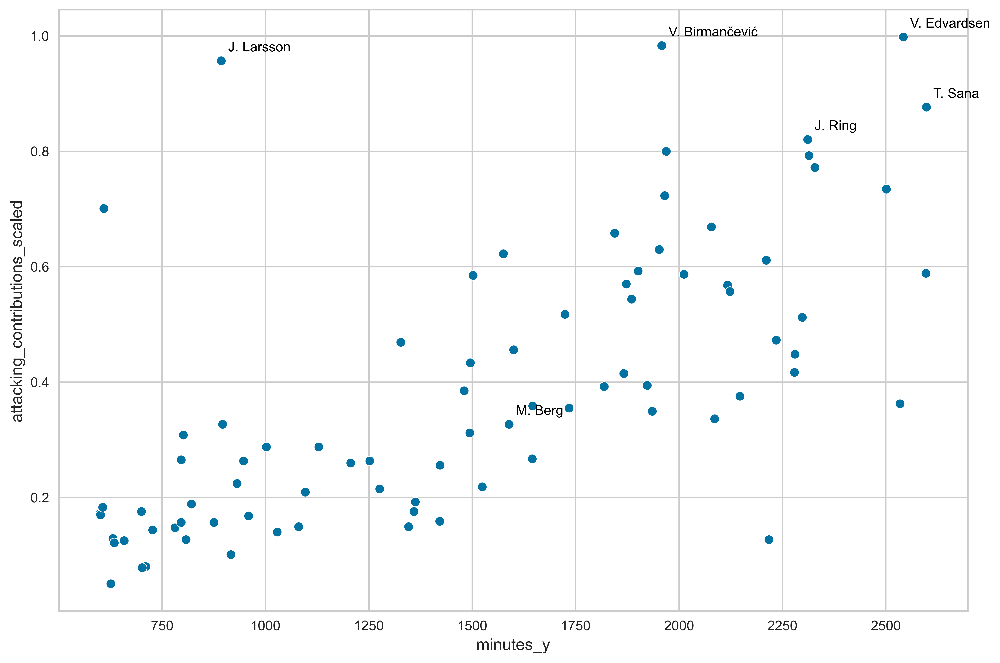

In [223]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=df_scaled.loc[df_scaled['FW'] == 1], x='minutes_y', y='attacking_contributions_scaled')

# Add labels for the outliers
outliers = df_scaled.loc[df_scaled['FW'] == 1].query('attacking_contributions_scaled > attacking_contributions_scaled.quantile(0.95)')
outlier_labels = []
for index, row in outliers.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['attacking_contributions_scaled']), xytext=(5, 5),
                         textcoords='offset points', ha='left', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Annotate specific index values
specific_indices = [33]
specific_labels = []
for index in specific_indices:
    row = df_scaled.loc[index]
    label = plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['attacking_contributions_scaled']), xytext=(5, 5),
                         textcoords='offset points', ha='left', va='bottom', fontsize=10, color='black')
    specific_labels.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels + specific_labels)

# Set plot title and axis labels
plt.title('Attacking contributions over full season', fontsize=18)
plt.xlabel('Minutes played', fontsize=14)
plt.ylabel('Attacking contributions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.savefig(fname='AttackingContributions.png', transparent=True)
# Show the plot
plt.show()


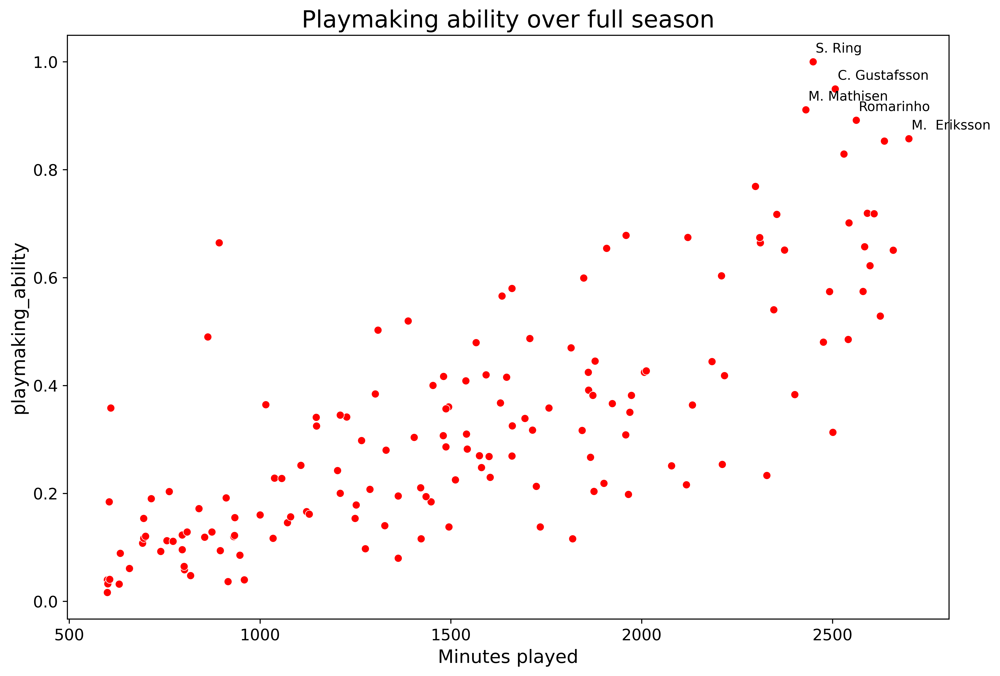

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=df_scaled.loc[df_scaled['MF'] == 1], x='minutes_y', y='playmaking_ability_scaled', color='red')

# Add labels for the outliers
outliers = df_scaled.loc[df_scaled['MF'] == 1].query('playmaking_ability_scaled > playmaking_ability_scaled.quantile(0.97)')
for index, row in outliers.iterrows():
    plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['playmaking_ability_scaled']), xytext=(2, 5),
                 textcoords='offset points', ha='left', va='bottom', fontsize=10, color='black')

# Set plot title and axis labels
plt.title('Playmaking ability over full season', fontsize=18)
plt.xlabel('Minutes played', fontsize=14)
plt.ylabel('playmaking_ability', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.savefig(fname='PlaymakingContributions.png', transparent=True)
# Show the plot
plt.show()


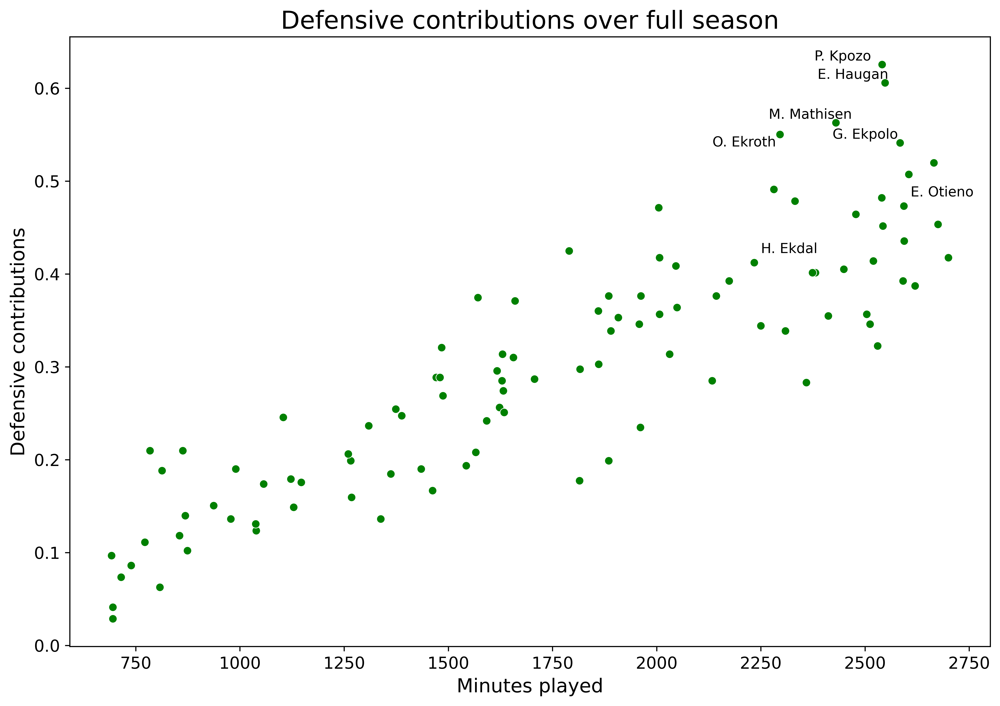

In [ ]:

# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=df_scaled.loc[df_scaled['DF'] == 1], x='minutes_y', y='defensive_contributions_scaled', color='green')

# Add labels for the outliers
outliers = df_scaled.loc[df_scaled['DF'] == 1].query('defensive_contributions_scaled > defensive_contributions_scaled.quantile(0.958)')
outlier_labels = []
for index, row in outliers.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['defensive_contributions_scaled']), xytext=(-50,0),
                         textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Annotate specific index values
specific_indices = [175, 4]
specific_labels = []
for index in specific_indices:
    row = df_scaled.loc[index]
    label = plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['defensive_contributions_scaled']), xytext=(5, 5),
                         textcoords='offset points', ha='left', va='bottom', fontsize=10, color='black')
    specific_labels.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels)

# Set plot title and axis labels
plt.title('Defensive contributions over full season', fontsize=18)
plt.xlabel('Minutes played', fontsize=14)
plt.ylabel('Defensive contributions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.savefig(fname='DefensiveContributions.png', transparent=True)
# Show the plot
plt.show()

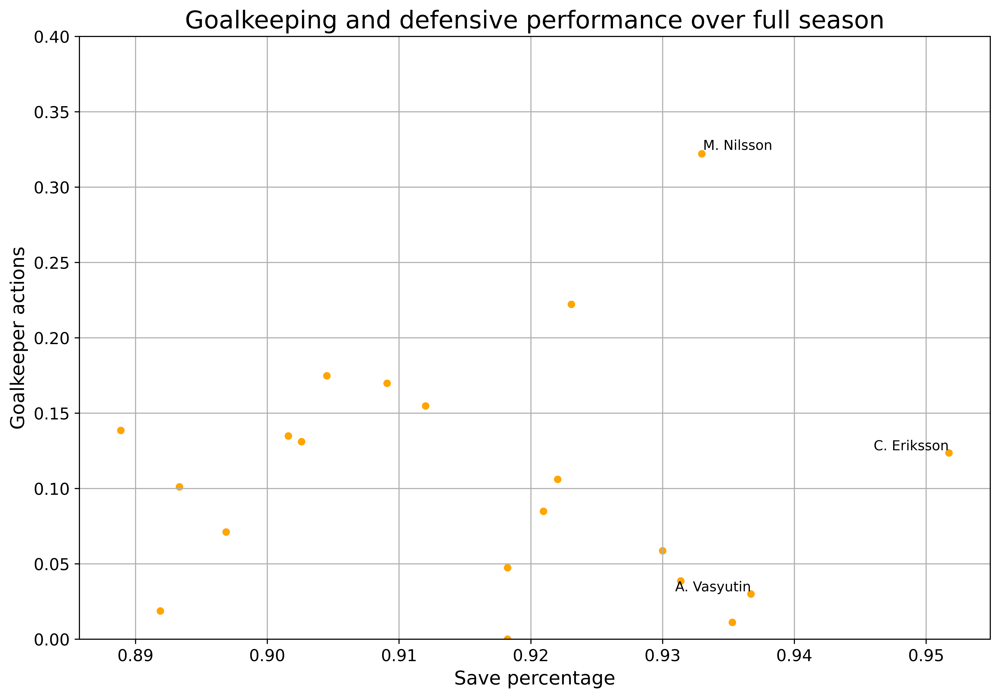

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=df_scaled.loc[df_scaled['GK'] == 1], x='save_percentage', y='gk_actions_scaled', color='orange')

# Add labels for the outliers
outliers = df_scaled.loc[df_scaled['GK'] == 1].query('save_percentage > save_percentage.quantile(0.94)')
outlier_labels = []
for index, row in outliers.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['save_percentage'], row['gk_actions_scaled']), xytext=(0,0),
                         textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Add labels for the outliers
outliers1 = df_scaled.loc[df_scaled['GK'] == 1].query('gk_actions_scaled > gk_actions_scaled.quantile(0.94)')
outlier_labels1 = []
for index, row in outliers1.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['save_percentage'], row['gk_actions_scaled']), xytext=(0,0),
                         textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels1.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels1)

# Set plot title and axis labels
plt.title('Goalkeeping and defensive performance over full season', fontsize=18)
plt.xlabel('Save percentage', fontsize=14)
plt.ylabel('Goalkeeper actions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0,0.4)
plt.grid()

plt.savefig(fname='GKDefPerformance.png', transparent=True)
# Show the plot
plt.show()

In [ ]:
fw_mf_subset = df_scaled.loc[(df_scaled['FW']==1) | (df_scaled['MF']==1)]

In [ ]:
df_subset = df_scaled.loc[df_scaled['DF']==1]

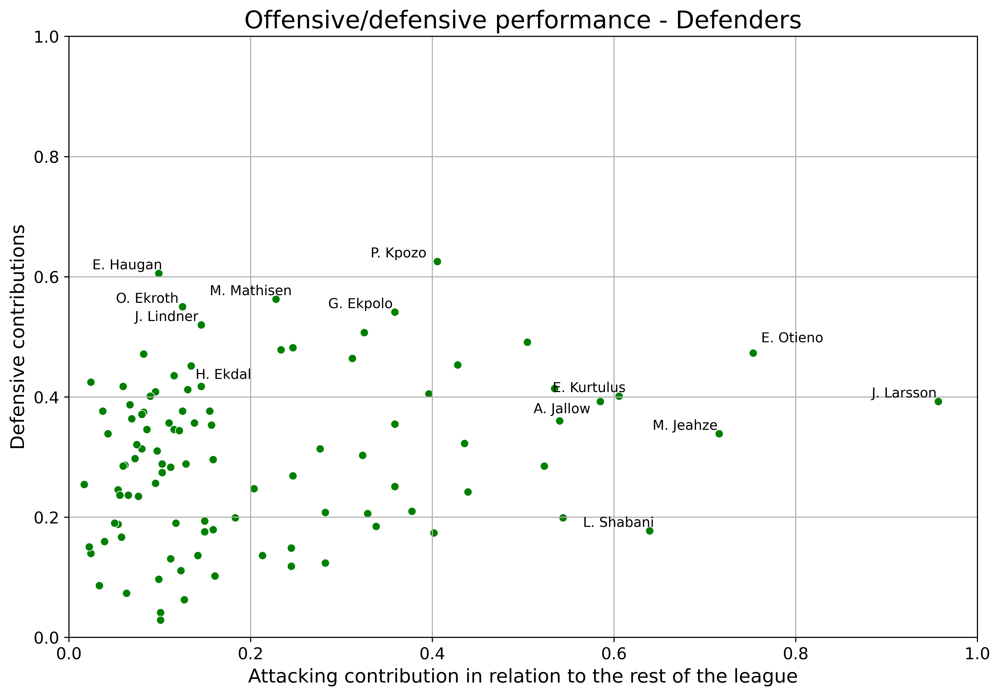

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=df_subset, x='attacking_contributions_scaled', y='defensive_contributions_scaled', color='green')

# Identify outliers based on defensive contributions and attacking contributions
outliers = df_subset[(df_subset['defensive_contributions_scaled'] > df_subset['defensive_contributions_scaled'].quantile(0.95)) |
                     (df_subset['attacking_contributions_scaled'] > df_subset['attacking_contributions_scaled'].quantile(0.95))]

# Add labels for the outliers
outlier_labels = []
for index, row in outliers.iterrows():
    # Check if the outlier has already been labeled
    if index not in specific_indices:
        label = plt.annotate(row['friendly_name'], xy=(row['attacking_contributions_scaled'], row['defensive_contributions_scaled']), xytext=(-50, 0),
                             textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
        outlier_labels.append(label)
        
# Annotate specific index values
specific_indices = [175, 4]
specific_labels = []
for index in specific_indices:
    row = df_scaled.loc[index]
    label = plt.annotate(row['friendly_name'], xy=(row['attacking_contributions_scaled'], row['defensive_contributions_scaled']), xytext=(5, 5),
                         textcoords='offset points', ha='left', va='bottom', fontsize=10, color='black')
    specific_labels.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels + specific_labels)

# Set plot title and axis labels
plt.title('Offensive/defensive performance - Defenders', fontsize=18)
plt.xlabel('Attacking contribution in relation to the rest of the league', fontsize=14)
plt.ylabel('Defensive contributions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1)
plt.xlim(0,1)
plt.grid()

plt.savefig(fname='OffDefPerformance-DEF.png', transparent=True)

# Show the plot
plt.show()


In [340]:
mf_subset = df_scaled.loc[df_scaled['MF']==1].loc[df_scaled['FW']==0].loc[df_scaled['DF']==0]

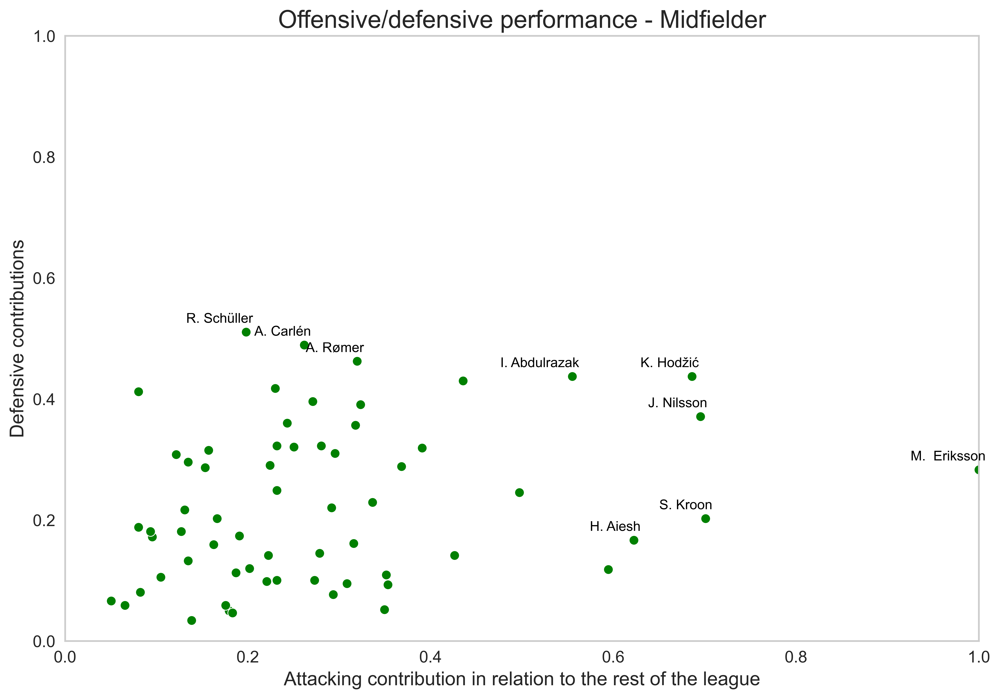

In [341]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
sns.scatterplot(data=mf_subset, x='attacking_contributions_scaled', y='defensive_contributions_scaled', color='green')

# Identify outliers based on defensive contributions and attacking contributions
outliers = mf_subset[(mf_subset['defensive_contributions_scaled'] > mf_subset['defensive_contributions_scaled'].quantile(0.93)) |
                     (mf_subset['attacking_contributions_scaled'] > mf_subset['attacking_contributions_scaled'].quantile(0.93))]

# Add labels for the outliers
outlier_labels = []
for index, row in outliers.iterrows():
    # Check if the outlier has already been labeled
    if index not in specific_indices:
        label = plt.annotate(row['friendly_name'], xy=(row['attacking_contributions_scaled'], row['defensive_contributions_scaled']), xytext=(5, 5),
                             textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
        outlier_labels.append(label)


# Set plot title and axis labels
plt.title('Offensive/defensive performance - Midfielder', fontsize=18)
plt.xlabel('Attacking contribution in relation to the rest of the league', fontsize=14)
plt.ylabel('Defensive contributions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1)
plt.xlim(0,1)
plt.grid()

plt.savefig(fname='OffDefPerformance-MID.png', transparent=True)

# Show the plot
plt.show()


In [ ]:
fw_subset = df_scaled.loc[df_scaled['FW']==1]

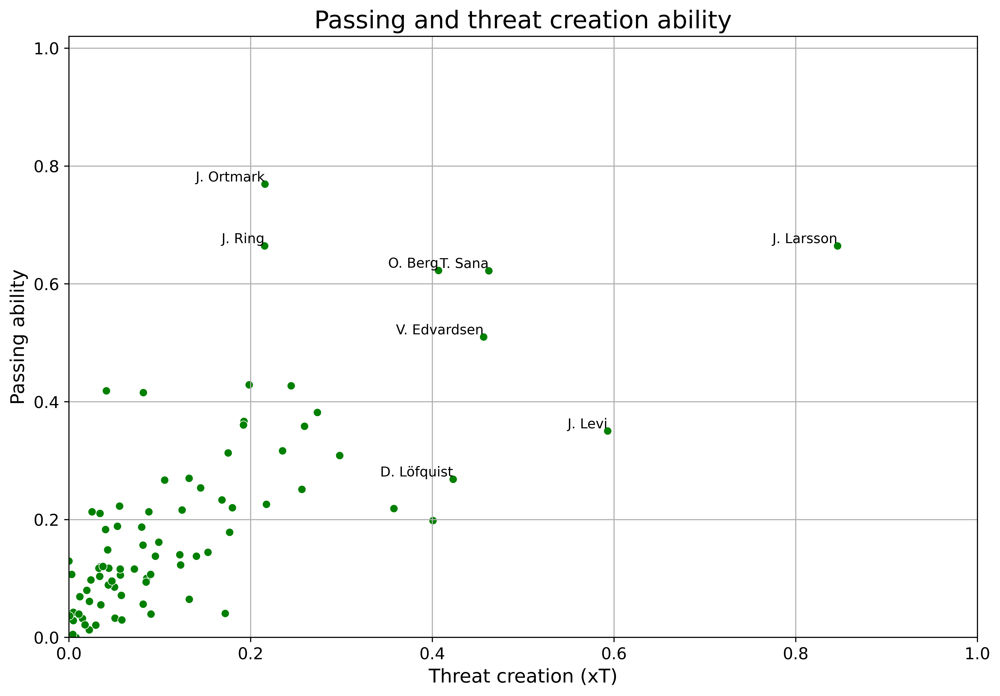

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
PlaymakingAttackingPerformance = sns.scatterplot(data=fw_subset, y='playmaking_ability_scaled', x='xt_scaled', color='green')

# Identify outliers based on defensive contributions and attacking contributions
outliers = fw_subset[(fw_subset['playmaking_ability_scaled'] > fw_subset['playmaking_ability_scaled'].quantile(0.95)) |
                     (fw_subset['xt_scaled'] > fw_subset['xt_scaled'].quantile(0.95))]

# Add labels for the outliers
outlier_labels = []
for index, row in outliers.iterrows():
    # Check if the outlier has already been labeled
    label = plt.annotate(row['friendly_name'], xy=(row['xt_scaled'], row['playmaking_ability_scaled']), xytext=(0, 0),
                            textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Set plot title and axis labels
plt.title('Passing and threat creation ability', fontsize=18)
plt.ylabel('Passing ability', fontsize=14)
plt.xlabel('Threat creation (xT)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0,1.02)
plt.xlim(0,1)
plt.grid()


plt.savefig(fname='PlaymakingXTPerformance.png', transparent=True)

# Show the plot
plt.show()


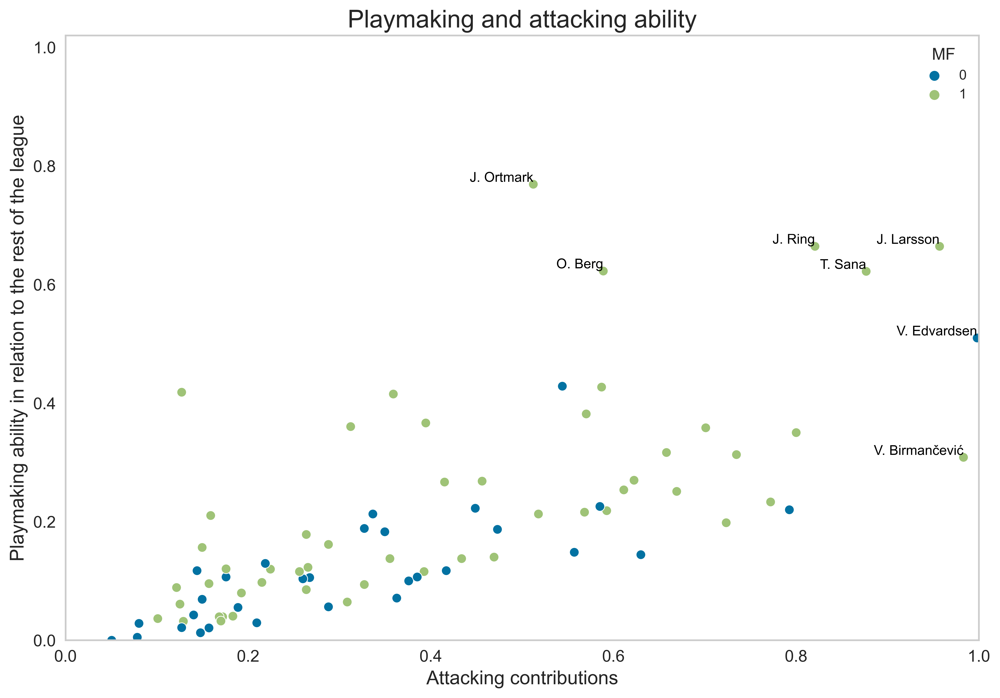

In [356]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot
PlaymakingAttackingPerformance = sns.scatterplot(data=fw_subset, y='playmaking_ability_scaled', x='attacking_contributions_scaled', color='green', hue='MF')

# Identify outliers based on defensive contributions and attacking contributions
outliers = fw_subset[(fw_subset['playmaking_ability_scaled'] > fw_subset['playmaking_ability_scaled'].quantile(0.95)) |
                     (fw_subset['attacking_contributions_scaled'] > fw_subset['attacking_contributions_scaled'].quantile(0.95))]

# Add labels for the outliers
outlier_labels = []
for index, row in outliers.iterrows():
    # Check if the outlier has already been labeled
    label = plt.annotate(row['friendly_name'], xy=(row['attacking_contributions_scaled'], row['playmaking_ability_scaled']), xytext=(0, 0),
                            textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Set plot title and axis labels
plt.title('Playmaking and attacking ability', fontsize=18)
plt.ylabel('Playmaking ability in relation to the rest of the league', fontsize=14)
plt.xlabel('Attacking contributions', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0,1.02)
plt.xlim(0,1)
plt.grid()


plt.savefig(fname='PlaymakingAttackingPerformance.png', transparent=True)

# Show the plot
plt.show()


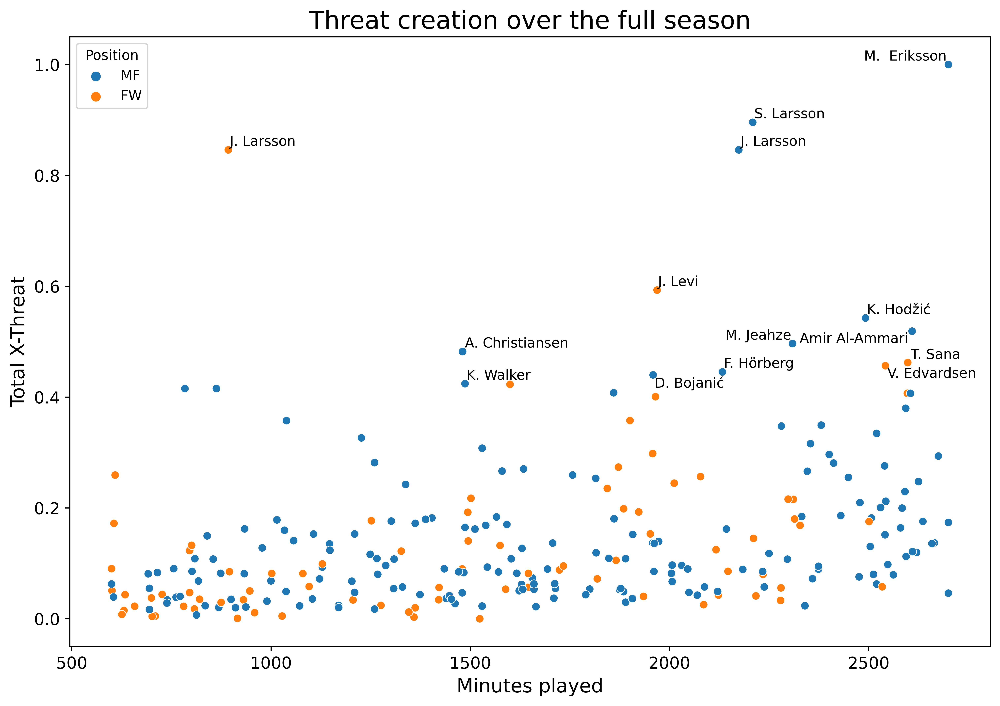

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot with different colors for FW and MF
scatterplot = sns.scatterplot(data=df_scaled, x='minutes_y', y='xt_scaled', hue='FW')

# Identify outliers based on Carry into the box and Pass into the box
outliers = df_scaled[(df_scaled['xt_scaled'] > df_scaled['xt_scaled'].quantile(0.95))]

# Add labels for the outliers with the same color as the data point
outlier_labels = []
for index, row in outliers.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['minutes_y'], row['xt_scaled']), xytext=(0, 0),
                         textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels)

# Set plot title and axis labels
plt.title('Threat creation over the full season', fontsize=18)
plt.xlabel('Minutes played', fontsize=14)
plt.ylabel('Total X-Threat', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Modify the legend labels
legend_labels = {'MF': 'MF', 'FW': 'FW'}
handles, _ = scatterplot.get_legend_handles_labels()
plt.legend(handles, legend_labels.values(), title='Position', loc='upper left')

plt.savefig(fname='XT_fullseason.png', transparent=True)
# Show the plot
plt.show()


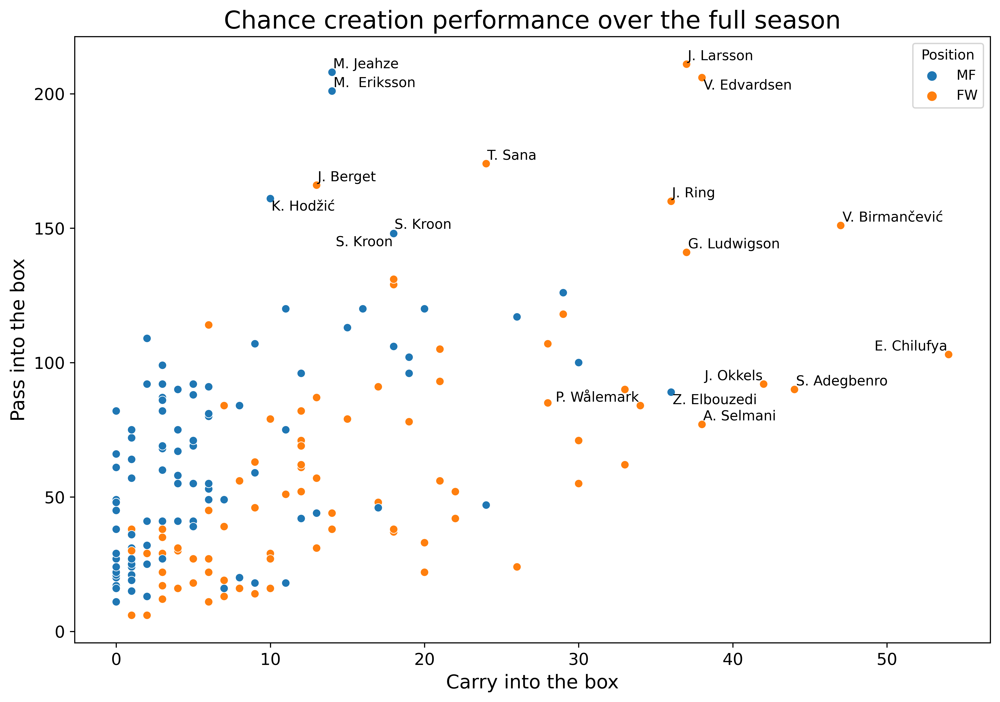

In [ ]:
# Create the figure
plt.figure(figsize=(12, 8), dpi=600)

# Plot the scatterplot with different colors for FW and MF
scatterplot = sns.scatterplot(data=fw_mf_subset, x='Carry into the box', y='Pass into the box', hue='FW')

# Identify outliers based on Carry into the box and Pass into the box
outliers = fw_mf_subset[(fw_mf_subset['Carry into the box'] > fw_mf_subset['Carry into the box'].quantile(0.94)) |
                        (fw_mf_subset['Pass into the box'] > fw_mf_subset['Pass into the box'].quantile(0.94))]

# Add labels for the outliers with the same color as the data point
outlier_labels = []
for index, row in outliers.iterrows():
    label = plt.annotate(row['friendly_name'], xy=(row['Carry into the box'], row['Pass into the box']), xytext=(0, 0),
                         textcoords='offset points', ha='right', va='bottom', fontsize=10, color='black')
    outlier_labels.append(label)

# Adjust the positions of annotations to prevent overlap
adjust_text(outlier_labels)

# Set plot title and axis labels
plt.title('Chance creation performance over the full season', fontsize=18)
plt.xlabel('Carry into the box', fontsize=14)
plt.ylabel('Pass into the box', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Modify the legend labels
legend_labels = {'MF': 'MF', 'FW': 'FW'}
handles, _ = scatterplot.get_legend_handles_labels()
plt.legend(handles, legend_labels.values(), title='Position', loc='upper right')

plt.savefig(fname='ThreatCreator.png', transparent=True)
# Show the plot
plt.show()


In [ ]:
df_scaled.columns

Index(['friendly_name', 'team', 'position', 'age', 'born', 'matches_played',
       'starts', 'minutes_y', 'Goals', 'Air challenge successful',
       ...
       'challenge_success_scaled', 'xt_scaled', 'challenges_scaled',
       'clearances_scaled', 'blocks_scaled', 'interceptions_scaled', 'FW',
       'MF', 'GK', 'DF'],
      dtype='object', length=154)

In [ ]:
df_scaled.loc[df_scaled['GK']==1].sort_values(by='save_percentage', ascending=False)

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Goals,Air challenge successful,...,challenge_success_scaled,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF
93,C. Eriksson,Mjällby,[GK],25.0,1995.0,20.0,20.0,1800.0,NaN,2,...,0.380952,0.053546,0.011691,0.104167,0.000000,0.175676,0,0,1,0
188,A. Vasyutin,Djurgården,[GK],25.0,1995.0,10.0,10.0,835.0,9.3,1,...,0.122751,0.023623,0.004677,0.083333,0.000000,0.027027,0,0,1,0
259,K. Nordfeldt,AIK,[GK],31.0,1989.0,14.0,14.0,1260.0,14.0,0,...,0.552381,0.017486,0.000000,0.041667,0.000000,0.004505,0,0,1,0
158,M. Nilsson,Halmstad,[GK],27.0,1993.0,29.0,29.0,2610.0,NaN,0,...,0.205537,0.121167,0.017927,0.125000,0.000000,0.243243,0,0,1,0
7,B. Janošević,AIK,[GK],31.0,1989.0,16.0,16.0,1440.0,16.0,1,...,0.176762,0.036946,0.008574,0.062500,0.000000,0.058559,0,0,1,0
130,J. Dahlin,Malmö FF,[GK],34.0,1986.0,19.0,19.0,1665.0,18.5,1,...,0.441905,0.021908,0.003118,0.062500,0.000000,0.063063,0,0,1,0
53,S. Lukić,Varberg,[GK],41.0,1979.0,20.0,20.0,1712.0,19.0,0,...,0.000000,0.063349,0.005456,0.166667,0.000000,0.040541,0,0,1,0
248,D. Ousted,Hammarby,[GK],35.0,1985.0,22.0,21.0,1907.0,21.2,2,...,0.414286,0.036393,0.013250,0.083333,0.000000,0.085586,0,0,1,0
208,D. Mitov-Nilsson,Sirius,[GK],30.0,1991.0,17.0,17.0,1530.0,NaN,2,...,0.533333,0.022852,0.013250,0.083333,0.000000,0.103604,0,0,1,0
265,S. Brolin,Mjällby,[GK],20.0,2000.0,10.0,10.0,900.0,10.0,0,...,0.169963,0.035109,0.003897,0.020833,0.000000,0.067568,0,0,1,0


In [ ]:
df_scaled.loc[df_scaled['friendly_name']=='M. Mathisen']

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,challenge_success_scaled,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF
219,M. Mathisen,Sirius,"[DF, MF]",24.0,1996.0,27.0,27.0,2430.0,63,120,...,0.60996,0.186191,0.535464,0.395833,0.512195,0.797297,0,1,0,1


In [ ]:
df_scaled.loc[df_scaled['defensive_contributions_scaled'] > df_scaled['defensive_contributions_scaled'].quantile(0.94)].loc[df_scaled['MF']==1]

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,challenge_success_scaled,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF
123,P. Kpozo,Östersunds FK,"[DF, MF]",23.0,1997.0,29.0,29.0,2541.0,53,33,...,0.756805,0.151601,0.524552,0.500000,0.121951,0.963964,0,1,0,1
219,M. Mathisen,Sirius,"[DF, MF]",24.0,1996.0,27.0,27.0,2430.0,63,120,...,0.609960,0.186191,0.535464,0.395833,0.512195,0.797297,0,1,0,1


## CLUSTERING

In [256]:
df_cluster = experiment_threshold.copy()

In [257]:
df_cluster.columns

Index(['friendly_name', 'team', 'position', 'age', 'born', 'matches_played',
       'starts', 'minutes_y', 'Air challenge successful',
       'Air challenge unsuccessful', 'Assist', 'Bad ball control',
       'Block successful', 'Block unsuccessful', 'Carry', 'Carry into the box',
       'Challenge successful', 'Challenge unsuccessful', 'Clearance accurate',
       'Clearance inaccurate', 'Cross accurate', 'Cross inaccurate',
       'Direct free kick accurate', 'Direct free kick inaccurate',
       'Direct free kick shot accurate', 'Direct free kick shot inaccurate',
       'Dribble successful', 'Dribble unsuccessful', 'Foul', 'Goal',
       'Goal conceded', 'Goal kicks (Successful actions)',
       'Goal kicks (Unsuccessful actions)', 'Goalkeeper wide shot',
       'Interception', 'Interception successful', 'Interception unsuccessful',
       'Key pass', 'Left corner accurate', 'Left corner inaccurate',
       'Lost ball', 'Offside', 'Own goal', 'Pass accurate', 'Pass inaccurate',
   

In [258]:
df_cluster.drop(columns=['friendly_name', 'team', 'position', 'age', 'born', 'matches_played',
       'starts', 'minutes_y'], inplace=True)

In [260]:
print_missing_values(df_cluster)

Missing values in column: conversion_rate
Row 1: nan
Row 7: nan
Row 25: nan
Row 28: nan
Row 53: nan
Row 62: nan
Row 89: nan
Row 93: nan
Row 114: nan
Row 130: nan
Row 149: nan
Row 151: nan
Row 158: nan
Row 180: nan
Row 188: nan
Row 208: nan
Row 234: nan
Row 238: nan
Row 248: nan
Row 259: nan
Row 265: nan
Missing values in column: set_piece_performance
Row 1: nan
Row 2: nan
Row 3: nan
Row 4: nan
Row 7: nan
Row 11: nan
Row 12: nan
Row 15: nan
Row 16: nan
Row 17: nan
Row 18: nan
Row 19: nan
Row 20: nan
Row 21: nan
Row 22: nan
Row 24: nan
Row 25: nan
Row 28: nan
Row 29: nan
Row 32: nan
Row 33: nan
Row 35: nan
Row 36: nan
Row 37: nan
Row 40: nan
Row 46: nan
Row 48: nan
Row 49: nan
Row 53: nan
Row 57: nan
Row 58: nan
Row 59: nan
Row 60: nan
Row 61: nan
Row 62: nan
Row 65: nan
Row 67: nan
Row 69: nan
Row 70: nan
Row 71: nan
Row 72: nan
Row 76: nan
Row 78: nan
Row 79: nan
Row 83: nan
Row 84: nan
Row 85: nan
Row 88: nan
Row 89: nan
Row 90: nan
Row 91: nan
Row 92: nan
Row 93: nan
Row 95: nan
Row 

In [261]:
# first we have to get the inertia values for a variety of different cluster numbers
inertia_dict = {
    'clusters': []
    ,'inertia': []
}

for i in range(2,11): # we choose 2 as the minimum number of clusters. it doesnt really make sense to have 1 cluster
    scaler = StandardScaler()
    cluster = KMeans(n_clusters=i) # here we set the number of clusters for every iteration
    imputer = SimpleImputer(strategy='mean')
    pipe = make_pipeline(imputer, scaler, cluster)
    pipe.fit(df_cluster)
    inertia_dict['clusters'].append(i)
    inertia_dict['inertia'].append(pipe['kmeans'].inertia_)

inertia_df = pd.DataFrame(inertia_dict)

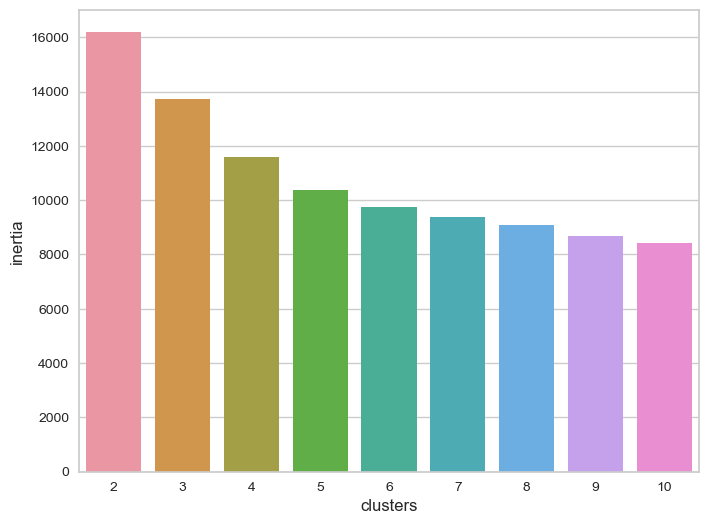

In [262]:
plt.figure(figsize=(8, 6))
g = sns.barplot(data=inertia_df, x='clusters', y='inertia')
plt.show()

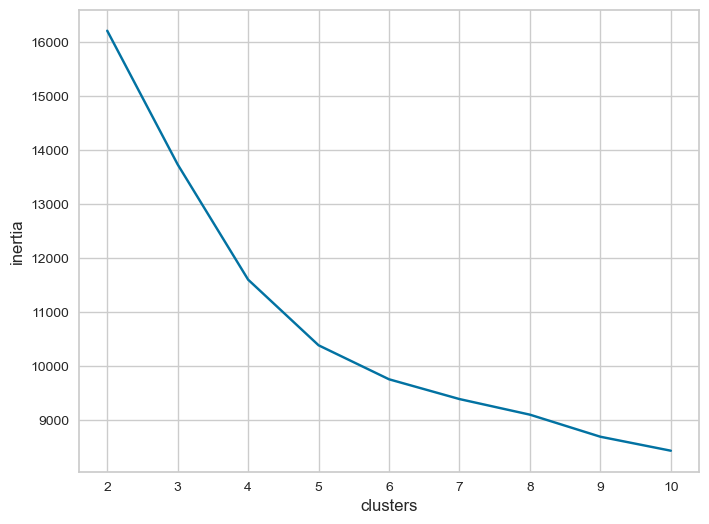

In [263]:
plt.figure(figsize=(8, 6))
g = sns.lineplot(data=inertia_df, x='clusters', y='inertia')
plt.show()

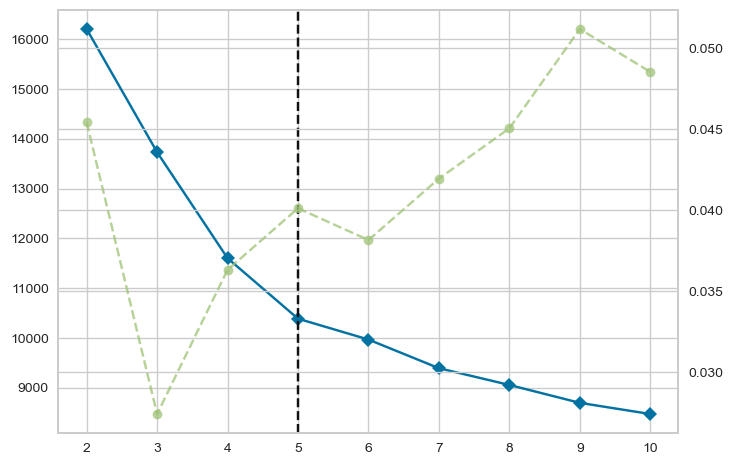

In [264]:
scaler = StandardScaler()
imputer = SimpleImputer(strategy='mean')
cluster = KElbowVisualizer(KMeans(n_init=10))
pipe = make_pipeline(imputer, scaler, cluster)

pipe.fit(df_cluster)
plt.show()

In [265]:

cluster = KMeans(n_clusters=5)
pipe = make_pipeline(imputer, scaler, cluster)

pipe.fit(df_cluster)

Pipeline(steps=[('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=5))])

In [266]:
df_scaled['clusters'] = pipe['kmeans'].labels_

In [267]:
df_scaled

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF,clusters
0,S. Larsson,AIK,[MF],35.0,1985.0,25.0,25.0,2209.0,17,8,...,0.895776,0.287607,0.104167,0.292683,0.454955,0,1,0,0,2
1,L. Hägg Johansson,Kalmar,[GK],26.0,1994.0,26.0,26.0,2340.0,2,6,...,0.023485,0.010133,0.083333,0.000000,0.216216,0,0,1,0,3
2,N. Bahoui,AIK,"[FW, MF]",29.0,1991.0,27.0,21.0,1819.0,53,43,...,0.072075,0.416212,0.104167,0.024390,0.198198,1,1,0,0,4
3,L. Sætra,Kalmar,[DF],29.0,1991.0,28.0,28.0,2504.0,32,110,...,0.130438,0.308652,0.312500,0.292683,0.599099,0,0,0,1,0
4,E. Otieno,AIK,[DF],24.0,1996.0,29.0,29.0,2593.0,51,32,...,0.379773,0.573655,0.416667,0.121951,0.590090,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,E. Björkander,Mjällby,[DF],24.0,1996.0,11.0,11.0,990.0,26,37,...,0.031847,0.109119,0.583333,0.243902,0.324324,0,0,0,1,1
263,A. Blomqvist,Mjällby,"[MF, FW]",28.0,1992.0,26.0,10.0,1080.0,14,9,...,0.081604,0.172253,0.020833,0.121951,0.193694,1,1,0,0,1
264,J. Stenmark,Kalmar,[DF],21.0,1999.0,15.0,8.0,739.0,10,20,...,0.028408,0.098987,0.145833,0.097561,0.090090,0,0,0,1,1
265,S. Brolin,Mjällby,[GK],20.0,2000.0,10.0,10.0,900.0,0,5,...,0.035109,0.003897,0.020833,0.000000,0.067568,0,0,1,0,3


## EDA on the different clusters

/Users/axelreman/anaconda3/lib/python3.10/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/axelreman/anaconda3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/Users/axelreman/anaconda3/lib/python3.10/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/axelreman/anaconda3/lib/python3.10/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/axelreman/anaconda3/lib/python3.10/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/axelreman/anaconda3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/Users/axelrem

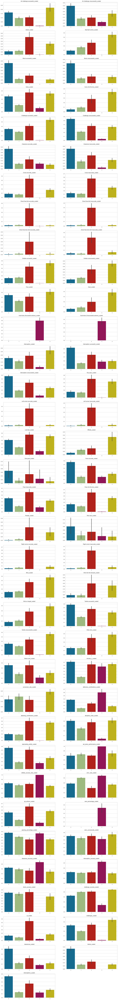

In [268]:
var_list = list(filter(lambda col: col.endswith('_scaled'), df_scaled.columns))

cols = 2
rows = math.ceil(len(var_list)/cols)

fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20,5*rows))

for i, ax in zip(var_list, axs.flat):
    g = sns.barplot(data=df_scaled, x='clusters', y=i, ax=ax)
    ax.set(xlabel='', ylabel='', title=i)

for i in axs.flat[::-1][:rows*cols-len(var_list)]:
    i.set_axis_off()

plt.show()

In [273]:
df_scaled.columns

Index(['friendly_name', 'team', 'position', 'age', 'born', 'matches_played',
       'starts', 'minutes_y', 'Air challenge successful',
       'Air challenge unsuccessful',
       ...
       'xt_scaled', 'challenges_scaled', 'clearances_scaled', 'blocks_scaled',
       'interceptions_scaled', 'FW', 'MF', 'GK', 'DF', 'clusters'],
      dtype='object', length=156)

In [278]:
df_scaled.loc[df_scaled['matches_played']>25].loc[df_scaled['minutes_y']<1200]

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF,clusters
71,B. Radulovic,AIK,[FW],21.0,1999.0,26.0,6.0,710.0,37,30,...,0.004832,0.228371,0.020833,0.097561,0.009009,1,0,0,0,1
104,J. Ondrejka,Elfsborg,[MF],18.0,2002.0,28.0,6.0,802.0,13,7,...,0.085605,0.188620,0.000000,0.048780,0.139640,0,1,0,0,1
216,J. Asoro,Djurgården,[FW],21.0,1999.0,26.0,11.0,1002.0,35,20,...,0.081793,0.239283,0.020833,0.000000,0.031532,1,0,0,0,1
249,M. Moro,Mjällby,[FW],25.0,1995.0,27.0,8.0,821.0,59,24,...,0.035245,0.253313,0.104167,0.048780,0.018018,1,0,0,0,1
263,A. Blomqvist,Mjällby,"[MF, FW]",28.0,1992.0,26.0,10.0,1080.0,14,9,...,0.081604,0.172253,0.020833,0.121951,0.193694,1,1,0,0,1


In [280]:
df_scaled.loc[df_scaled['clusters']==1].position.value_counts()

position
[MF]        31
[FW]        14
[DF]        14
[MF, DF]    13
[FW, MF]    12
[MF, FW]    11
[DF, MF]     6
[FW, DF]     1
Name: count, dtype: int64

In [368]:
df_scaled.loc[df_scaled['friendly_name']=='J. Larsson']

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF,clusters
38,J. Larsson,Elfsborg,[DF],30.0,1990.0,25.0,25.0,2174.0,23,39,...,0.846035,0.39127,0.395833,0.170732,0.617117,0,0,0,1,2
39,J. Larsson,Örebro,"[MF, FW]",22.0,1999.0,21.0,8.0,893.0,23,39,...,0.846035,0.39127,0.395833,0.170732,0.617117,1,1,0,0,2


In [369]:
df_scaled.iloc[[93, 123, 161, 38, 4, 178, 0, 219, 31, 30, 39]]


,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,xt_scaled,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,FW,MF,GK,DF,clusters
93,C. Eriksson,Mjällby,[GK],25.0,1995.0,20.0,20.0,1800.0,2,9,...,0.053546,0.011691,0.104167,0.000000,0.175676,0,0,1,0,3
123,P. Kpozo,Östersunds FK,"[DF, MF]",23.0,1997.0,29.0,29.0,2541.0,53,33,...,0.151601,0.524552,0.500000,0.121951,0.963964,0,1,0,1,0
161,E. Kurtulus,Halmstad,[DF],20.0,2000.0,29.0,27.0,2381.0,24,23,...,0.349370,0.491037,0.375000,0.219512,0.445946,0,0,0,1,0
38,J. Larsson,Elfsborg,[DF],30.0,1990.0,25.0,25.0,2174.0,23,39,...,0.846035,0.391270,0.395833,0.170732,0.617117,0,0,0,1,2
4,E. Otieno,AIK,[DF],24.0,1996.0,29.0,29.0,2593.0,51,32,...,0.379773,0.573655,0.416667,0.121951,0.590090,0,0,0,1,4
178,M. Eriksson,Djurgården,[MF],30.0,1990.0,30.0,30.0,2700.0,37,28,...,1.000000,0.449727,0.187500,0.170732,0.292793,0,1,0,0,2
0,S. Larsson,AIK,[MF],35.0,1985.0,25.0,25.0,2209.0,17,8,...,0.895776,0.287607,0.104167,0.292683,0.454955,0,1,0,0,2
219,M. Mathisen,Sirius,"[DF, MF]",24.0,1996.0,27.0,27.0,2430.0,63,120,...,0.186191,0.535464,0.395833,0.512195,0.797297,0,1,0,1,0
31,T. Sana,IFK Göteborg,"[MF, FW]",31.0,1989.0,29.0,29.0,2598.0,27,12,...,0.462322,0.345284,0.125000,0.024390,0.094595,1,1,0,0,2
30,V. Edvardsen,Degerfors,[FW],25.0,1996.0,29.0,29.0,2542.0,50,10,...,0.456570,0.381138,0.020833,0.024390,0.058559,1,0,0,0,4


## GK pizzaplot

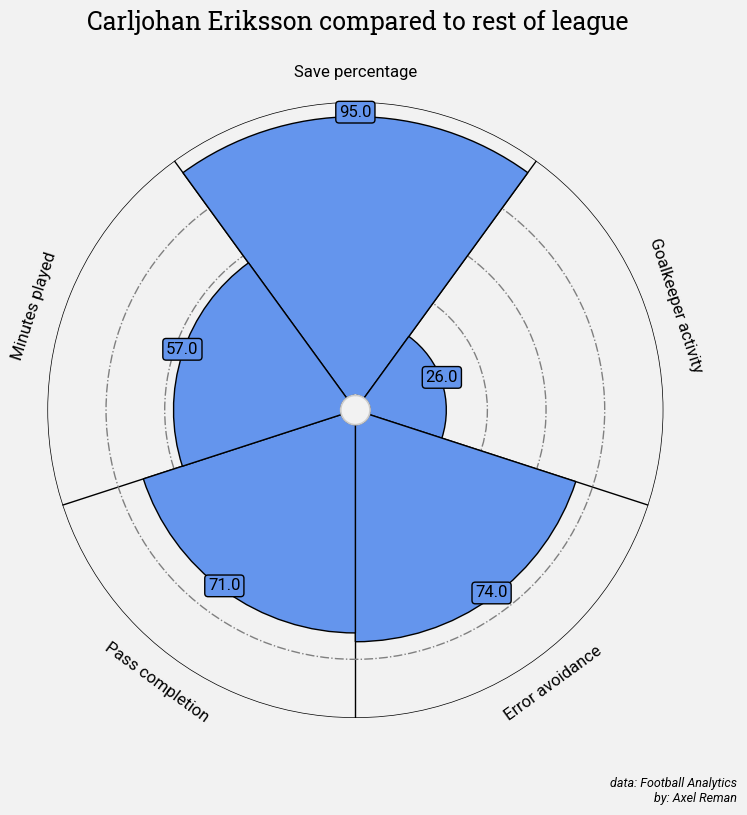

In [330]:
c_eriksson_spiderplot_data = spiderplotdata_defenders(dataframe=df_scaled, index=93)
c_eriksson_spiderplot = create_pyPizza_spiderplot(c_eriksson_spiderplot_data, 'Carljohan Eriksson')

### Defender pizzaplots

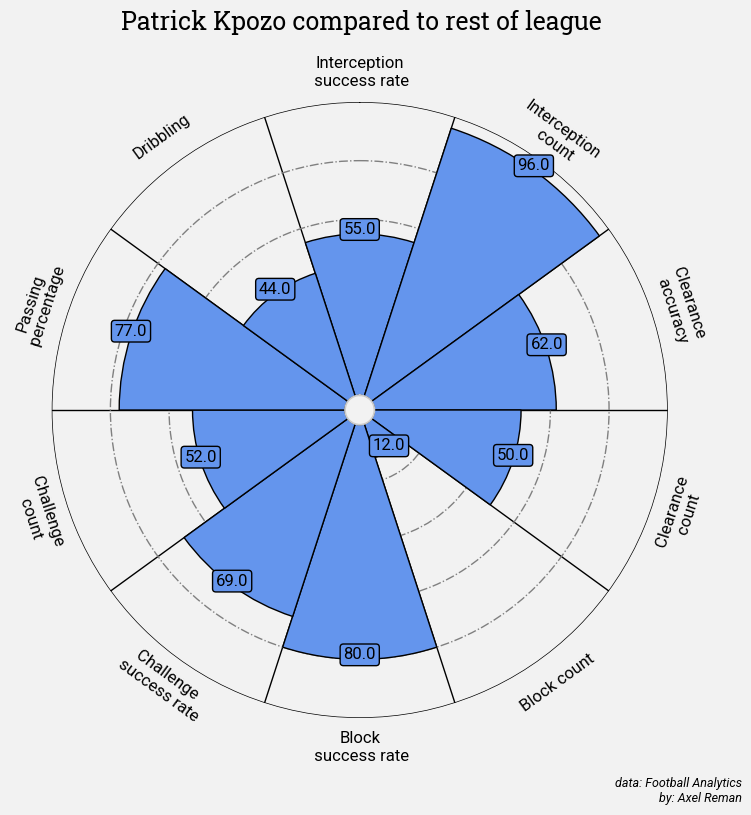

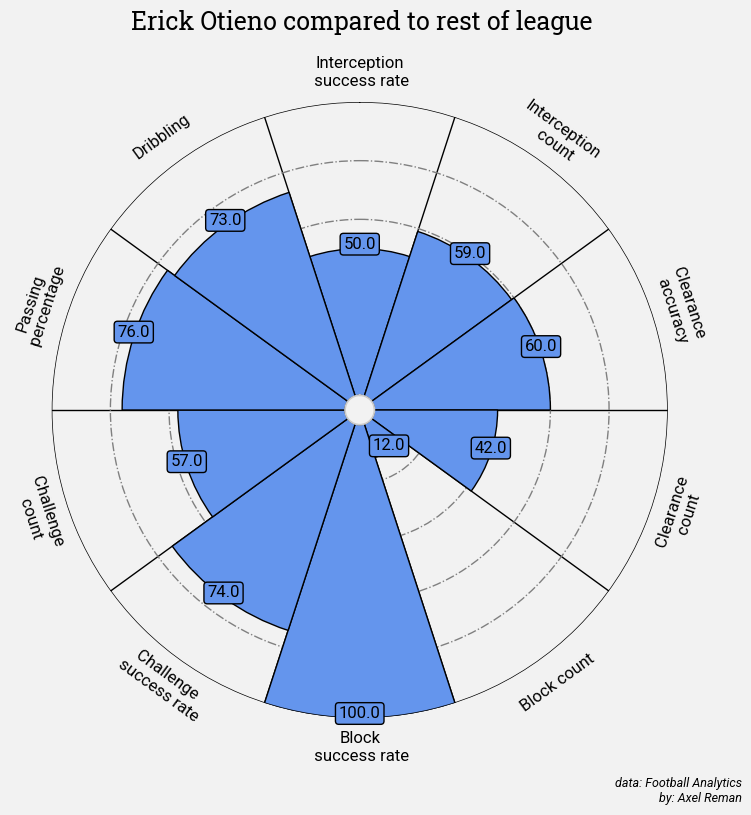

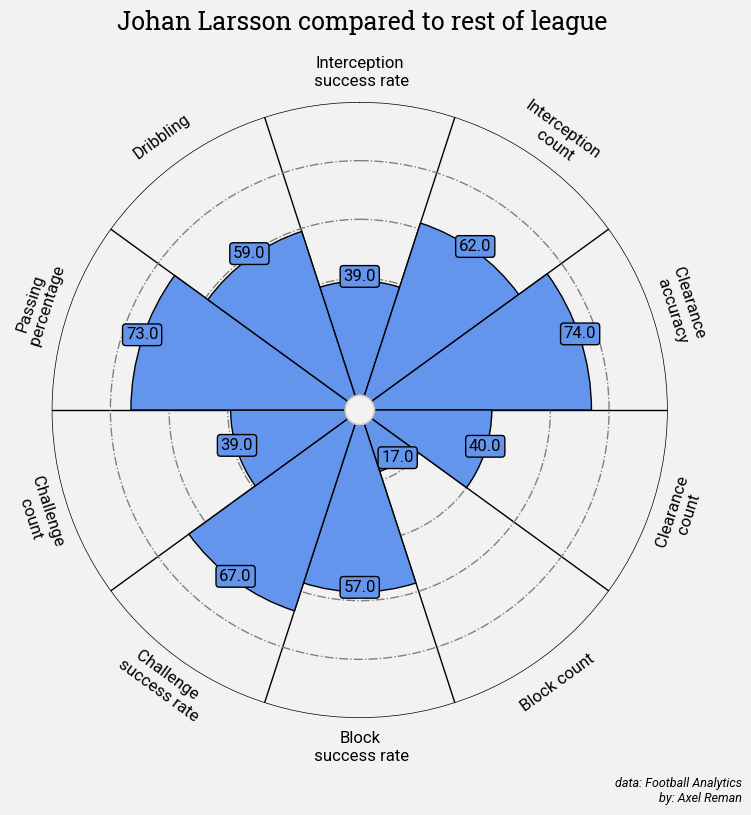

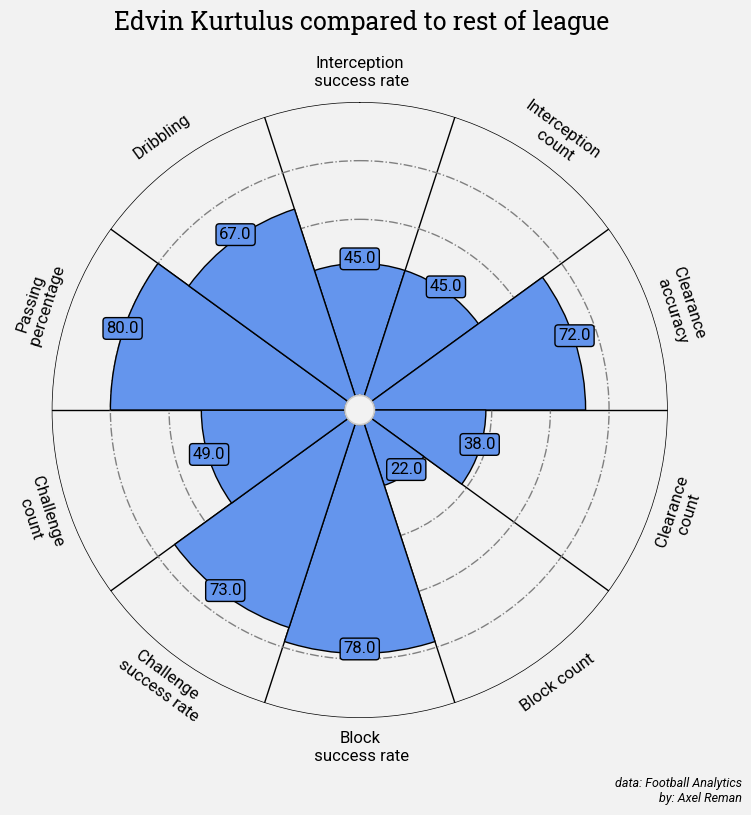

In [328]:
p_kpozo_spiderplot_data = spiderplotdata_defenders(dataframe=df_scaled, index=123)
e_kurtulus_spiderplot_data = spiderplotdata_defenders(dataframe=df_scaled, index=161)
j_larsson_spiderplot_data = spiderplotdata_defenders(dataframe=df_scaled, index=38)
e_otieno_spiderplot_data = spiderplotdata_defenders(dataframe=df_scaled, index=4)

create_pyPizza_spiderplot(p_kpozo_spiderplot_data, 'Patrick Kpozo')
create_pyPizza_spiderplot(e_otieno_spiderplot_data, 'Erick Otieno')
create_pyPizza_spiderplot(j_larsson_spiderplot_data, 'Johan Larsson')
create_pyPizza_spiderplot(e_kurtulus_spiderplot_data, 'Edvin Kurtulus')

### Midfielder pizzaplots

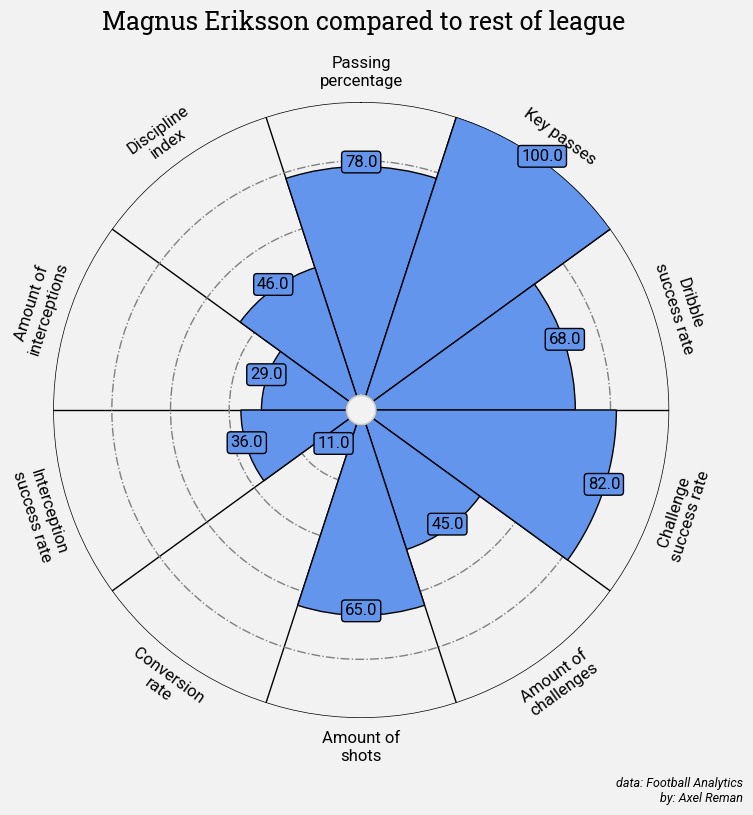

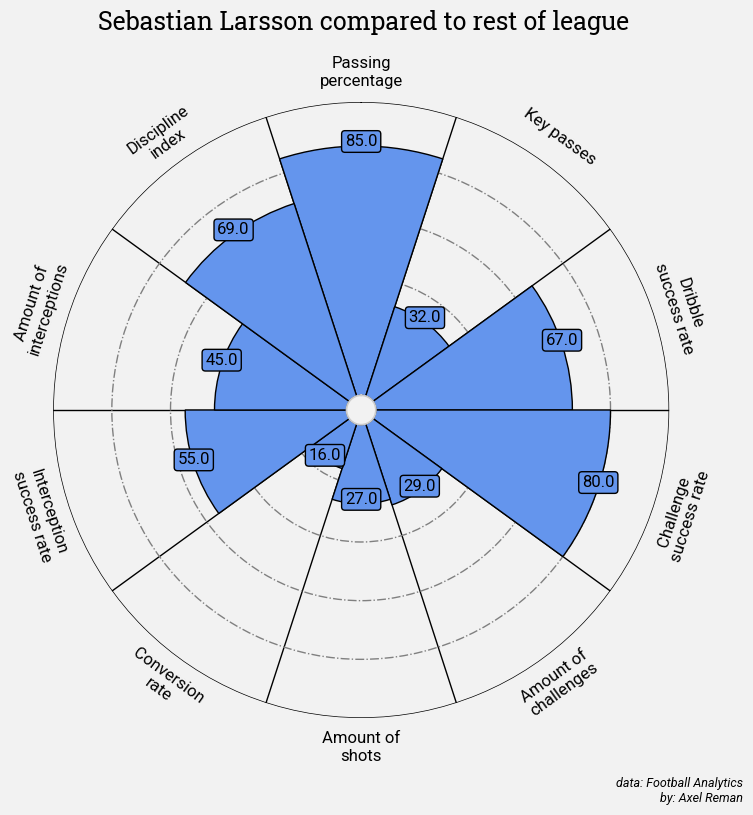

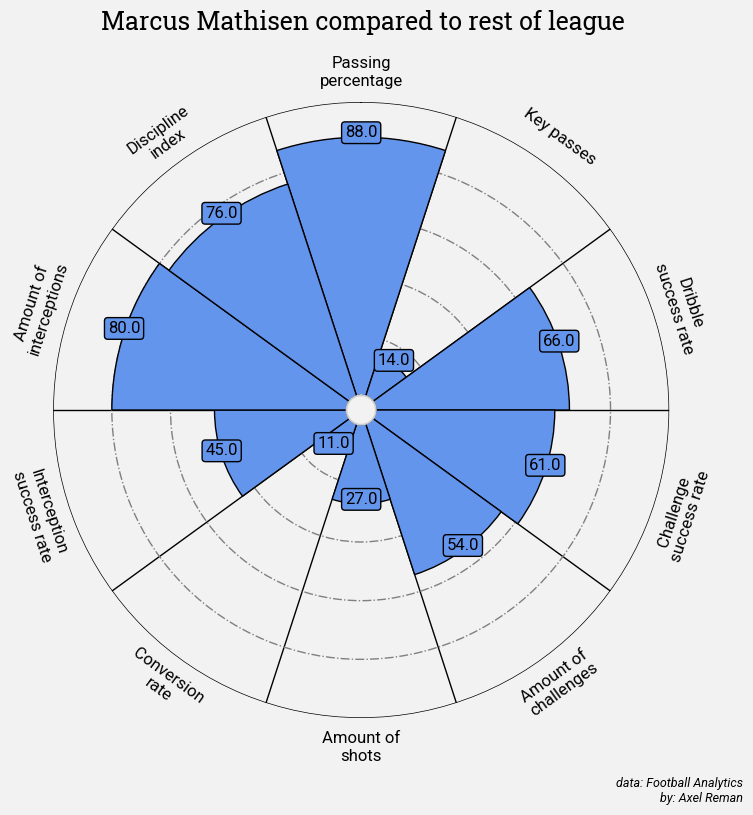

In [358]:
m_eriksson_spiderplot_data = spiderplotdata_midfielders(dataframe=df_scaled, index=178)
s_larsson_spiderplot_data = spiderplotdata_midfielders(dataframe=df_scaled, index=0)
m_mathisen_spiderplot_data = spiderplotdata_midfielders(dataframe=df_scaled, index=219)

create_pyPizza_spiderplot(m_eriksson_spiderplot_data, 'Magnus Eriksson')
create_pyPizza_spiderplot(s_larsson_spiderplot_data, 'Sebastian Larsson')
create_pyPizza_spiderplot(m_mathisen_spiderplot_data, 'Marcus Mathisen')

### Attacker pizzaplots

In [414]:
df_scaled[df_scaled['Shot_scaled']>0.5].sort_values(by='conversion_rate_scaled',ascending=False)

,friendly_name,team,position,age,born,matches_played,starts,minutes_y,Air challenge successful,Air challenge unsuccessful,...,challenges_scaled,clearances_scaled,blocks_scaled,interceptions_scaled,crossing_accuracy_scaled,crosses_scaled,FW,MF,GK,DF
183,S. Adegbenro,IFK Norrköping,"[FW, MF]",25.0,1995.0,30.0,25.0,2328.0,70,34,...,0.605612,0.104167,0.073171,0.112613,0.984809,0.605612,1,1,0,0
8,O. Berg,Kalmar,"[FW, MF]",27.0,1993.0,30.0,29.0,2597.0,40,10,...,0.503507,0.104167,0.048780,0.184685,0.963152,0.503507,1,1,0,0
206,G. Ludwigson,Hammarby,"[FW, MF]",27.0,1993.0,30.0,28.0,2501.0,88,46,...,0.540140,0.270833,0.170732,0.337838,0.863325,0.540140,1,1,0,0
35,B. Turgott,Östersunds FK,[FW],26.0,1994.0,24.0,24.0,2147.0,33,4,...,0.326578,0.187500,0.048780,0.166667,0.967503,0.326578,1,0,0,0
30,V. Edvardsen,Degerfors,[FW],25.0,1996.0,29.0,29.0,2542.0,50,10,...,0.381138,0.020833,0.024390,0.058559,0.979716,0.381138,1,0,0,0
222,C. Kouakou,Sirius,[FW],25.0,1995.0,30.0,30.0,2534.0,51,9,...,0.210444,0.041667,0.048780,0.027027,0.995693,0.210444,1,0,0,0
95,A. Jeremejeff,Häcken,[FW],27.0,1993.0,27.0,25.0,2235.0,68,60,...,0.526890,0.062500,0.170732,0.189189,0.969220,0.526890,1,0,0,0
94,P. Wålemark,Häcken,"[MF, FW]",19.0,2001.0,29.0,23.0,1965.0,28,9,...,0.289945,0.208333,0.073171,0.135135,0.956704,0.289945,1,1,0,0
203,A. Amoo,Hammarby,"[FW, MF]",18.0,2002.0,29.0,21.0,1844.0,24,12,...,0.494934,0.020833,0.000000,0.112613,0.972858,0.494934,1,1,0,0
2,N. Bahoui,AIK,"[FW, MF]",29.0,1991.0,27.0,21.0,1819.0,53,43,...,0.416212,0.104167,0.024390,0.198198,0.899666,0.416212,1,1,0,0


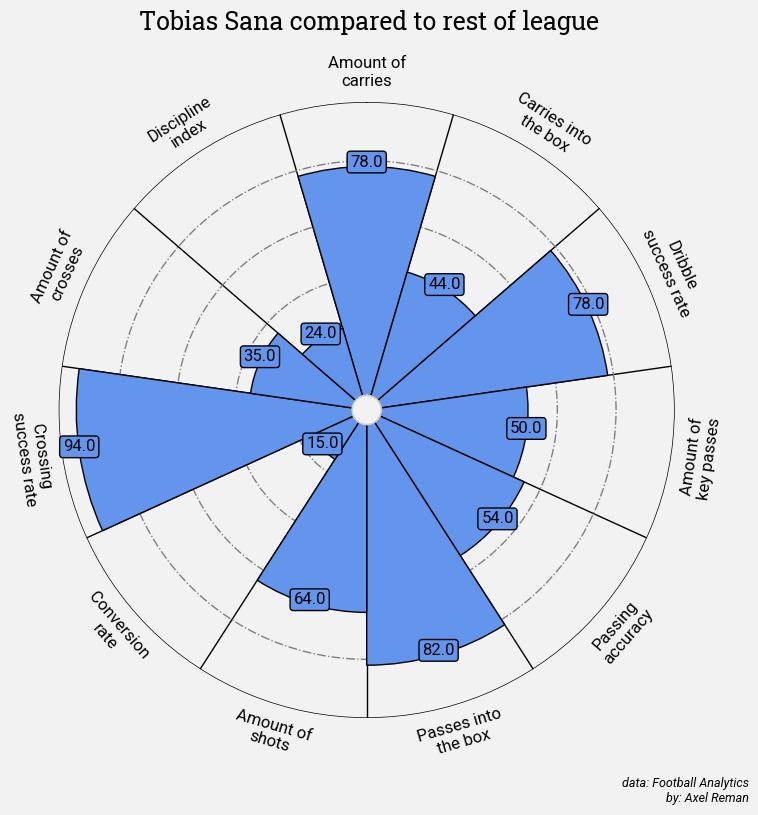

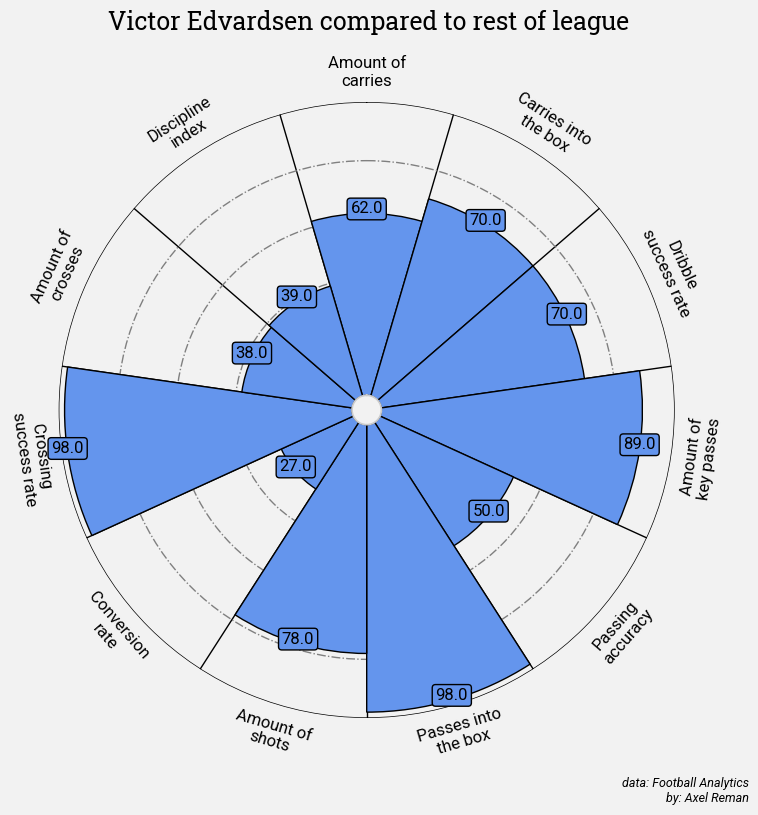

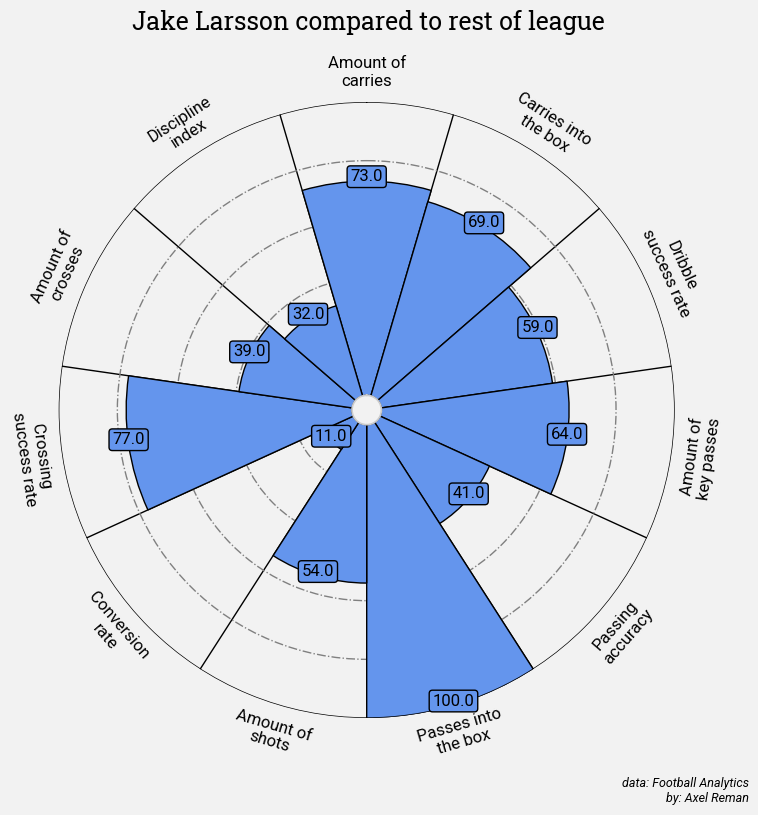

In [408]:
t_sana_spiderplot_data = spiderplotdata_attackers(dataframe=df_scaled, index=31)
v_edvardsen_spiderplot_data = spiderplotdata_attackers(dataframe=df_scaled, index=30)
j_larsson_FW_spiderplot_data = spiderplotdata_attackers(dataframe=df_scaled, index=39)

create_pyPizza_spiderplot(t_sana_spiderplot_data, 'Tobias Sana')
create_pyPizza_spiderplot(v_edvardsen_spiderplot_data, 'Victor Edvardsen')
create_pyPizza_spiderplot(j_larsson_FW_spiderplot_data, 'Jake Larsson')

## Unfinished parts of project... 

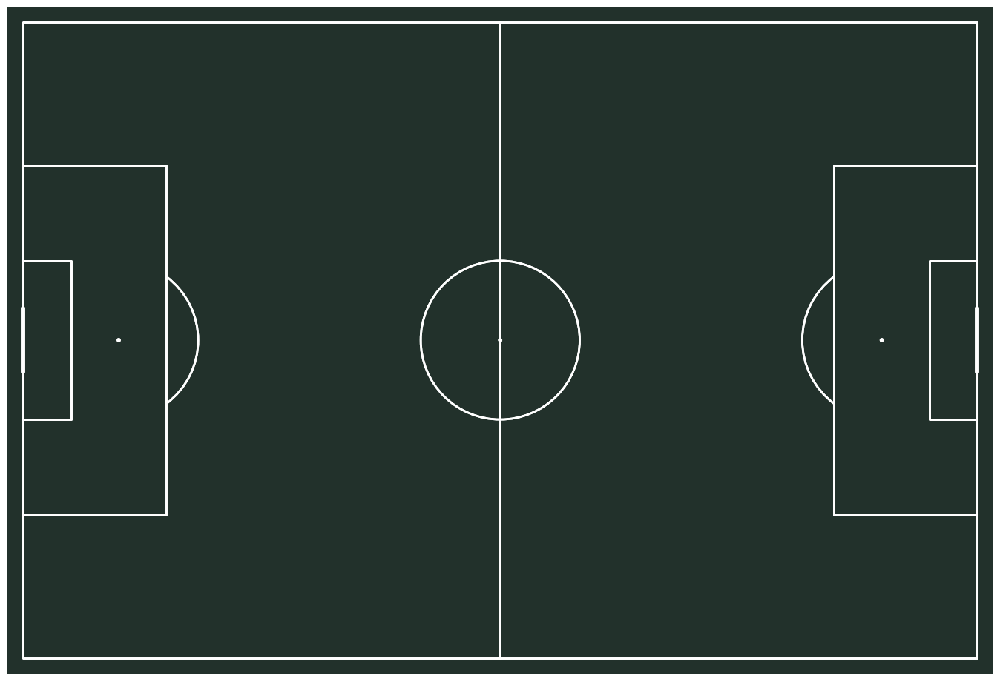

In [435]:
FIGWIDTH = 16
FIGHEIGHT = 9
NROWS = 1
NCOLS = 1
MAX_GRID = 1

pitch = Pitch(pad_top=2, pad_bottom=2, pad_left=2, pad_right=2, pitch_color='#22312b')
pitch.line_color = 'white'  # Set the pitch line color to white

GRID_WIDTH, GRID_HEIGHT = pitch.grid_dimensions(figwidth=FIGWIDTH, figheight=FIGHEIGHT,
                                                nrows=NROWS, ncols=NCOLS,
                                                max_grid=MAX_GRID, space=0)

fig, ax = pitch.grid(figheight=FIGHEIGHT, grid_width=GRID_WIDTH, grid_height=GRID_HEIGHT,
                     title_height=0, endnote_height=0)
fig.set_facecolor((1.0, 1.0, 1.0, 0.0))  # Set the figure background to transparent
ax.set_facecolor((1.0, 1.0, 1.0, 0.0))  # Set the axis background to transparent
pitch.draw(ax)  # Plot the pitch lines

# If you want to save the figure with a transparent background, use the following:
fig.savefig('football_pitch.png', transparent=True)

plt.show()